In [54]:
!pip install gdown
!pip install mne
import numpy as np
import mne
import os
import gdown
import zipfile
from mne.preprocessing import ICA
from mne.time_frequency import tfr_morlet
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')
%matplotlib inline
data_dir = "data/"
if not os.path.exists(data_dir):
 os.makedirs(data_dir)
# 从Google Drive下载
url = "https://drive.google.com/file/d/1bXD-_dDnH5Mv3DQrV7V9fYM4-xYsZ0DN/view?usp=sharing"
filename = "sample_data"
filepath = data_dir + filename + ".zip"
# 下载数据
gdown.download(url=url, output=filepath, quiet=False, fuzzy=True)
print("Download completes!")
# 数据解压
with zipfile.ZipFile(filepath, 'r') as zip:
 zip.extractall(data_dir)
print("Unzip completes!")
# 也可以通过百度⽹盘下载
# 链接:https://pan.baidu.com/s/1nQgoxeWoelDyIPduFES7YA 密码:fn96
# 下载后解压，并移动到data⽂件夹下
data_path = data_dir + 'sample_data/eeglab_data.set'
# 也可以直接使⽤你⾃⼰EEGLAB⽂件夹内的sample data⽂件夹下的数据
# data_path = "/Users/zitonglu/Desktop/EEG/eeglab14_1_2b/sample_data/eeglab_data.set"
# MNE-Python中对多种格式的脑电数据都进⾏了⽀持：
# *** 如数据后缀为.set (来⾃EEGLAB的数据)
# 使⽤mne.io.read_raw_eeglab()
# *** 如数据后缀为.vhdr (BrainVision系统)
# 使⽤mne.io.read_raw_brainvision()
# *** 如数据后缀为.edf
# 使⽤mne.io.read_raw_edf()
# *** 如数据后缀为.bdf (BioSemi放⼤器)
# 使⽤mne.io.read_raw_bdf()
# *** 如数据后缀为.gdf
# 使⽤mne.io.read_raw_gdf()
# *** 如数据后缀为.cnt (Neuroscan系统)
# 使⽤mne.io.read_raw_cnt()
# *** 如数据后缀为.egi或.mff
# 使⽤mne.io.read_raw_egi()
# *** 如数据后缀为.data
# 使⽤mne.io.read_raw_nicolet()
# *** 如数据后缀为.nxe (Nexstim eXimia系统)
# 使⽤mne.io.read_raw_eximia()
# *** 如数据后缀为.lay或.dat (Persyst系统)
# 使⽤mne.io.read_raw_persyst()
# *** 如数据后缀为.eeg (Nihon Kohden系统)
# 使⽤mne.io.read_raw_nihon()
# 读取数据
raw = mne.io.read_raw_eeglab(data_path, preload=True)

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


Downloading...
From: https://drive.google.com/uc?id=1bXD-_dDnH5Mv3DQrV7V9fYM4-xYsZ0DN
To: /Users/chenbohan/Desktop/data/sample_data.zip
100%|██████████████████████████████████████| 7.30M/7.30M [00:03<00:00, 2.28MB/s]


Download completes!
Unzip completes!
Reading /Users/chenbohan/Desktop/data/sample_data/eeglab_data.fdt
Reading 0 ... 30503  =      0.000 ...   238.305 secs...


In [55]:
print(raw)
print(raw.info)

<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>
<Info | 7 non-empty values
 bads: []
 ch_names: EEG 000, EEG 001, EEG 002, EEG 003, EEG 004, EEG 005, EEG 006, ...
 chs: 32 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>


In [56]:
# .locs⽂件地址
locs_info_path = data_dir + "sample_data/eeglab_chan32.locs"
# 读取电极位置信息
montage = mne.channels.read_custom_montage(locs_info_path)
# 读取正确的导联名称
new_chan_names = np.loadtxt(locs_info_path, dtype=str, usecols=3)
# 读取旧的导联名称
old_chan_names = raw.info["ch_names"]
# 创建字典，匹配新旧导联名称
chan_names_dict = {old_chan_names[i]:new_chan_names[i] for i in range(32)}
# 更新数据中的导联名称
raw.rename_channels(chan_names_dict)
# 传⼊数据的电极位置信息
raw.set_montage(montage)

<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>

In [57]:
# MNE中⼀般默认将所有导联类型设成“eeg”
# 这⾥将两个“EOG”导联的类型设定为“eog”
chan_types_dict = {"EOG1":"eog", "EOG2":"eog"}
raw.set_channel_types(chan_types_dict)

<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>

In [58]:
# 打印修改后的数据信息
print(raw.info)

<Info | 8 non-empty values
 bads: []
 ch_names: FPz, EOG1, F3, Fz, F4, EOG2, FC5, FC1, FC2, FC6, T7, C3, C4, Cz, ...
 chs: 30 EEG, 2 EOG
 custom_ref_applied: False
 dig: 35 items (3 Cardinal, 32 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>


Using matplotlib as 2D backend.


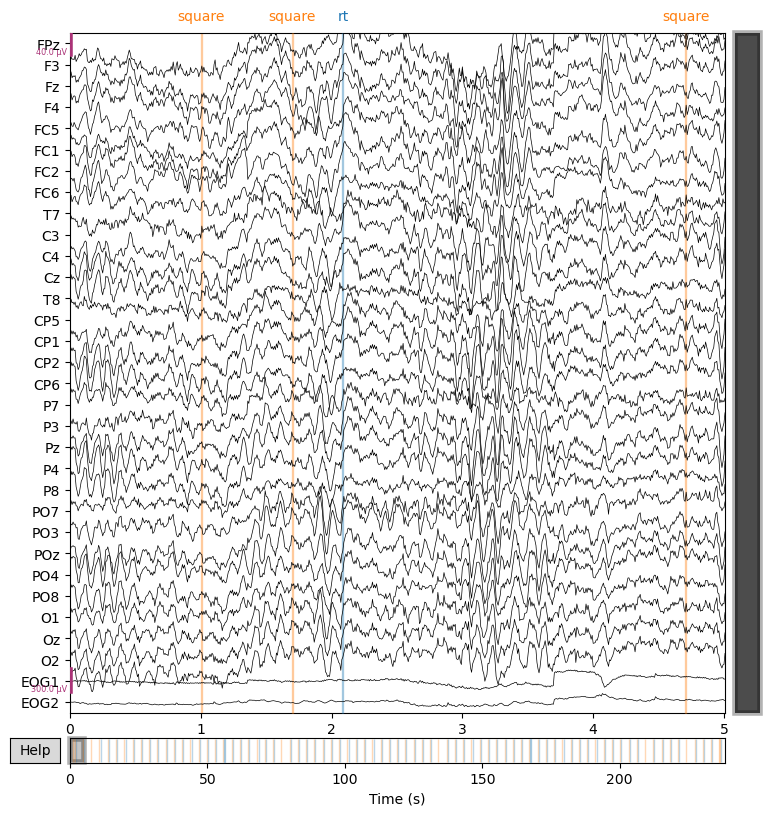

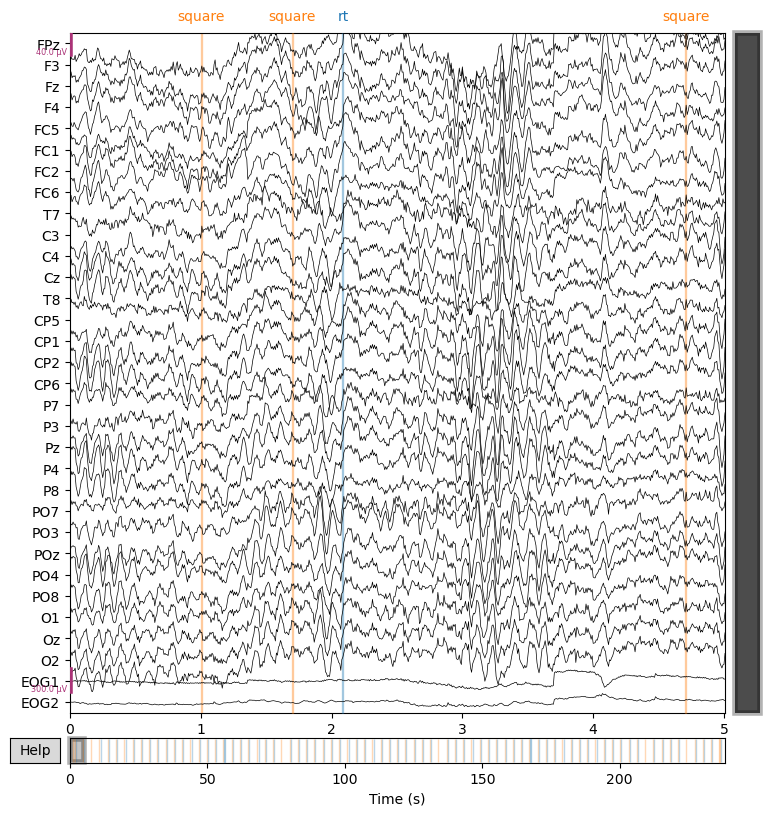

In [59]:
raw.plot(duration=5, n_channels=32, clipping=None)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


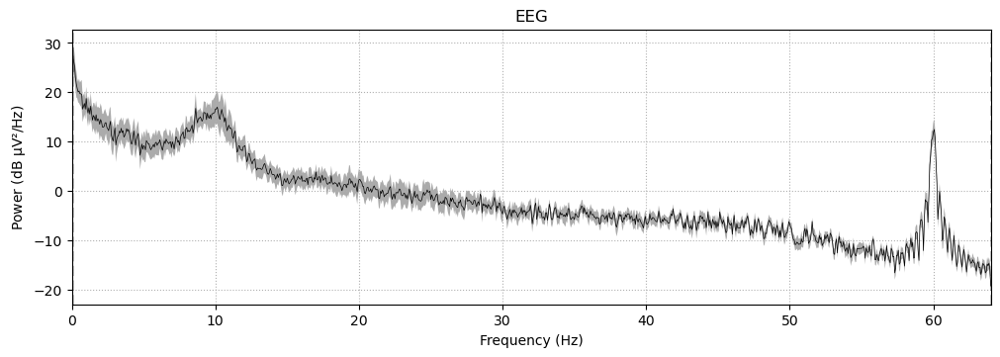

In [60]:
raw.plot_psd(average=True)

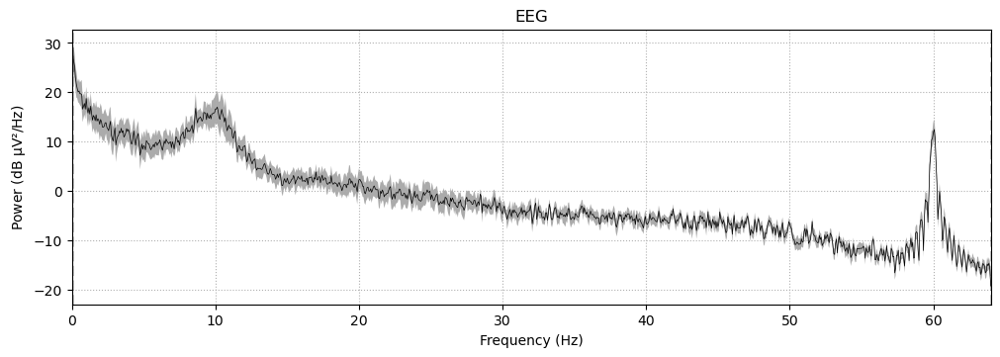

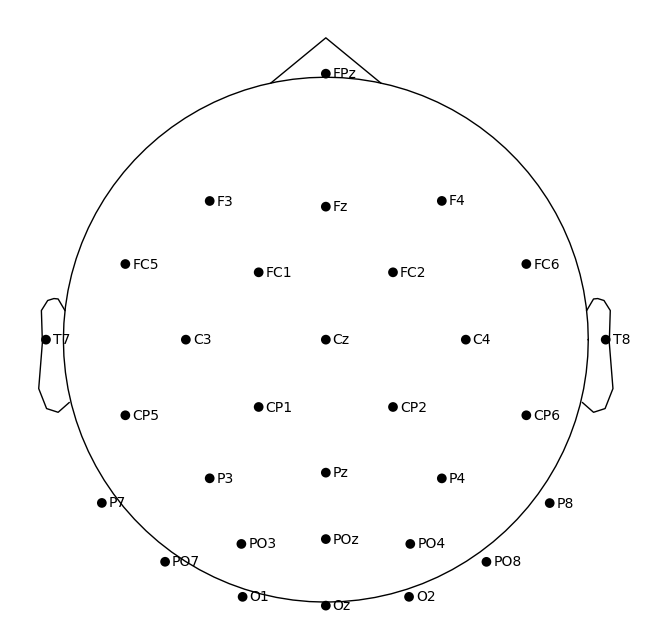

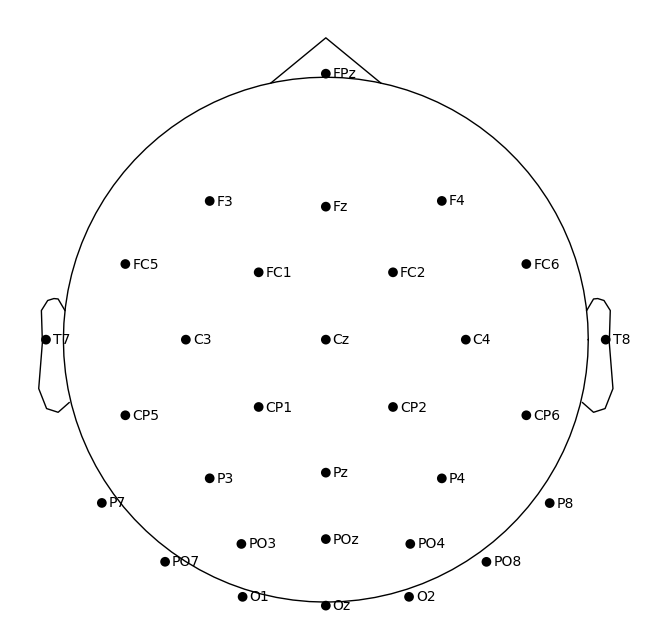

In [61]:
raw.plot_sensors(ch_type='eeg', show_names=True)

Effective window size : 16.000 (s)


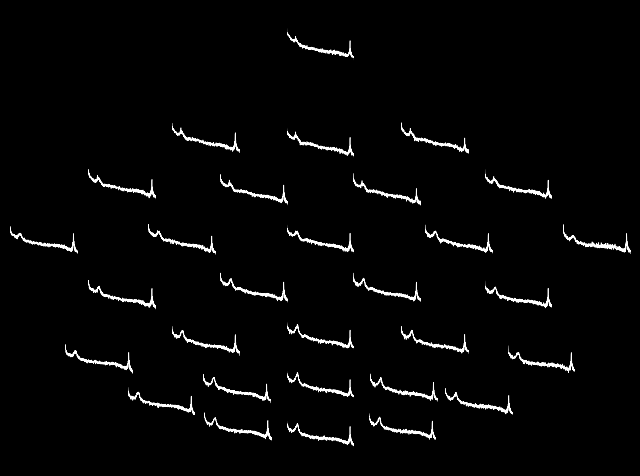

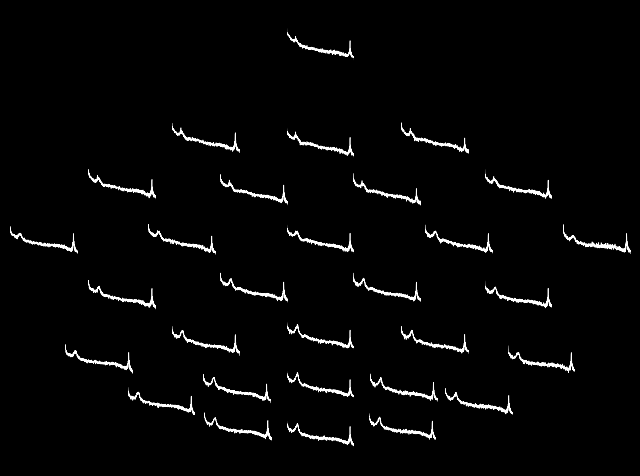

In [62]:
raw.compute_psd().plot_topo()

In [63]:
raw = raw.notch_filter(freqs=(60))

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 845 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


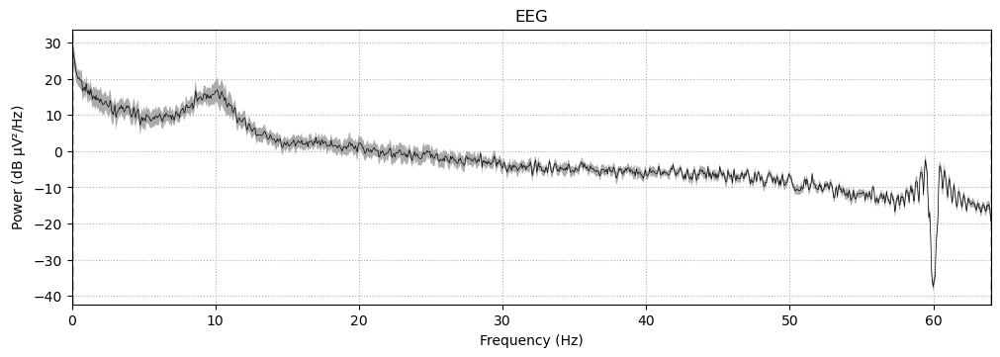

In [64]:
raw.plot_psd(average=True)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


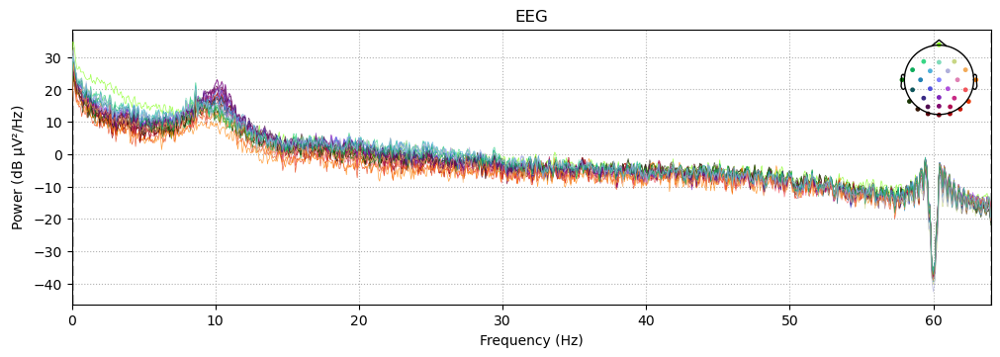

In [65]:
raw.plot_psd(average=False)

In [66]:
raw = raw.filter(l_freq=0.1, h_freq=30)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 4225 samples (33.008 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


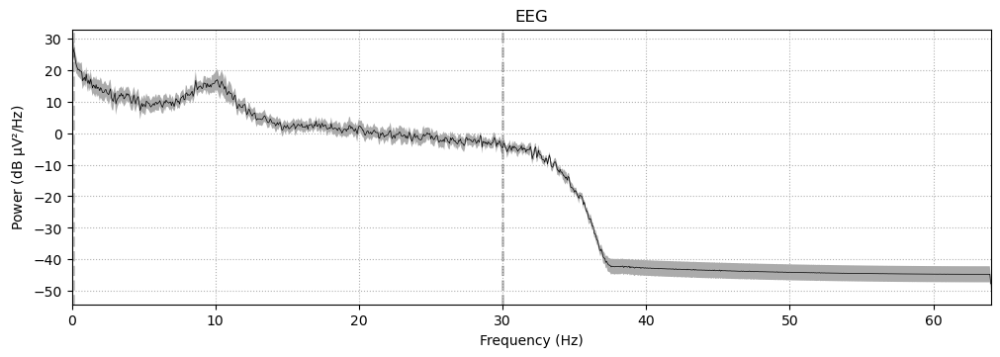

In [67]:
raw.plot_psd(average=True)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


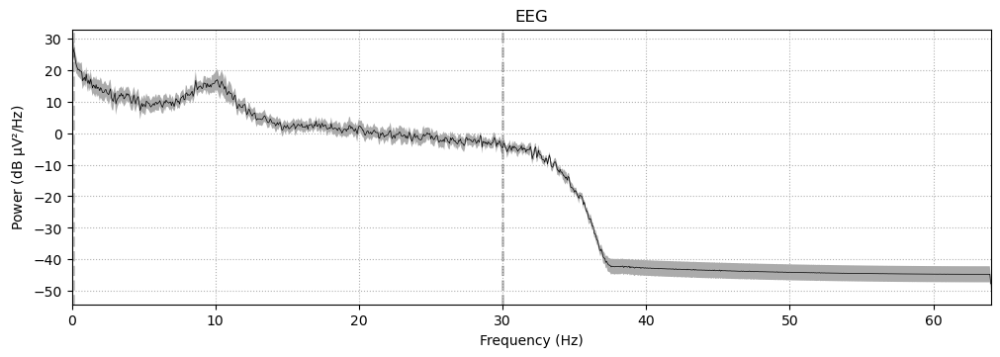

In [68]:
raw.plot_psd(average=True)

In [69]:
# 标记坏道
raw.info['bads'].append('FC5')
# 打印当前坏道
print(raw.info['bads'])

['FC5']


In [70]:
raw = raw.interpolate_bads()

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 29 sensor positions
Interpolating 1 sensors


In [71]:
ica = ICA(max_iter='auto')
raw_for_ica = raw.copy().filter(l_freq=1, h_freq=None)
ica.fit(raw_for_ica)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 423 samples (3.305 s)

Fitting ICA to data using 30 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by non-zero PCA components: 29 components
Fitting ICA took 1.4s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,58 iterations on raw data (30504 samples)
ICA components,29
Available PCA components,30
Channel types,eeg
ICA components marked for exclusion,—


In [72]:
from mne.preprocessing import ICA

ica_none = ICA(n_components=None, max_iter='auto', random_state=42)
raw_for_ica = raw.copy().filter(l_freq=1, h_freq=None)
ica_none.fit(raw_for_ica)

print(f"[None] ICA components: {ica_none.n_components_}")


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 423 samples (3.305 s)

Fitting ICA to data using 30 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 29 components


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Fitting ICA took 0.6s.
[None] ICA components: 29


In [73]:
ica_99 = ICA(n_components=0.99, max_iter='auto', random_state=42)
ica_99.fit(raw_for_ica)

print(f"[0.99] ICA components: {ica_99.n_components_}")


Fitting ICA to data using 30 channels (please be patient, this may take a while)
Selecting by explained variance: 13 components
Fitting ICA took 0.3s.
[0.99] ICA components: 13


Creating RawArray with float64 data, n_channels=31, n_times=30504
    Range : 0 ... 30503 =      0.000 ...   238.305 secs
Ready.


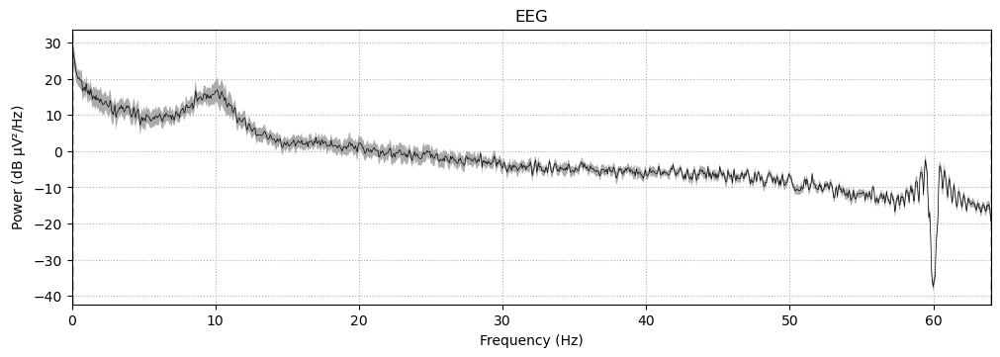

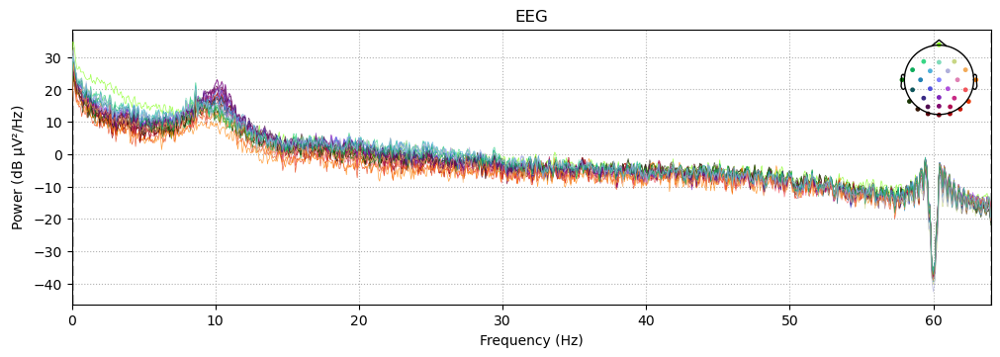

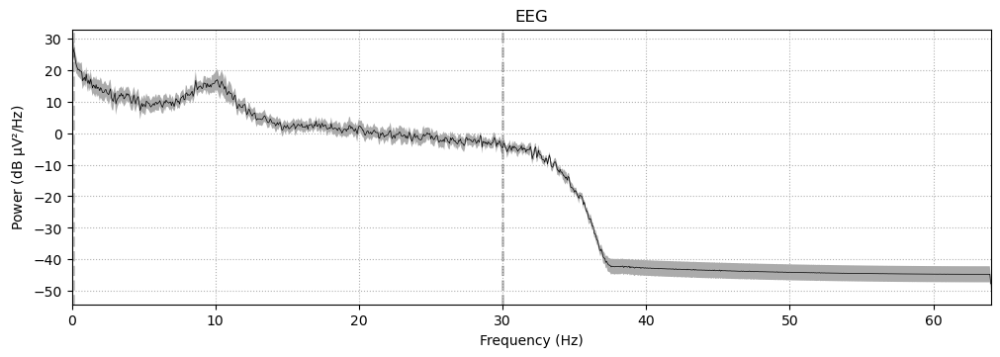

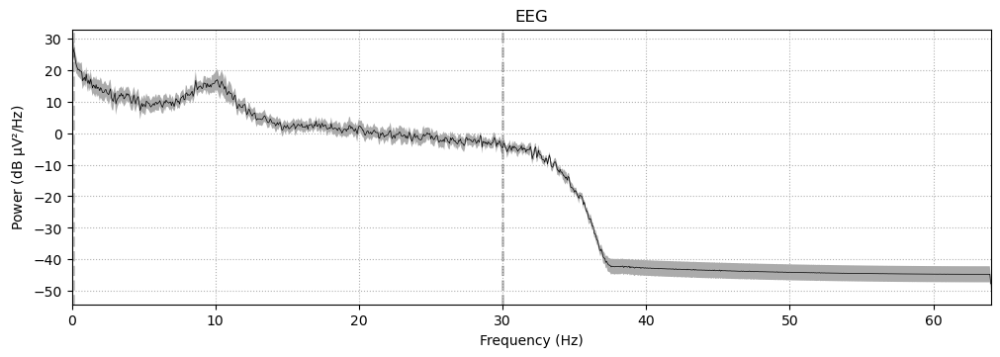

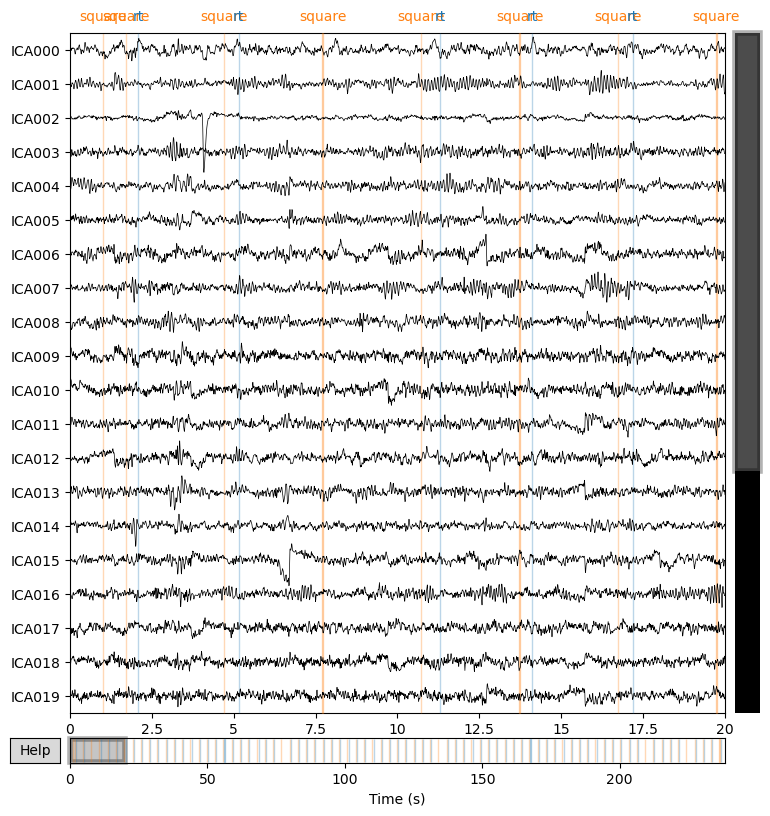

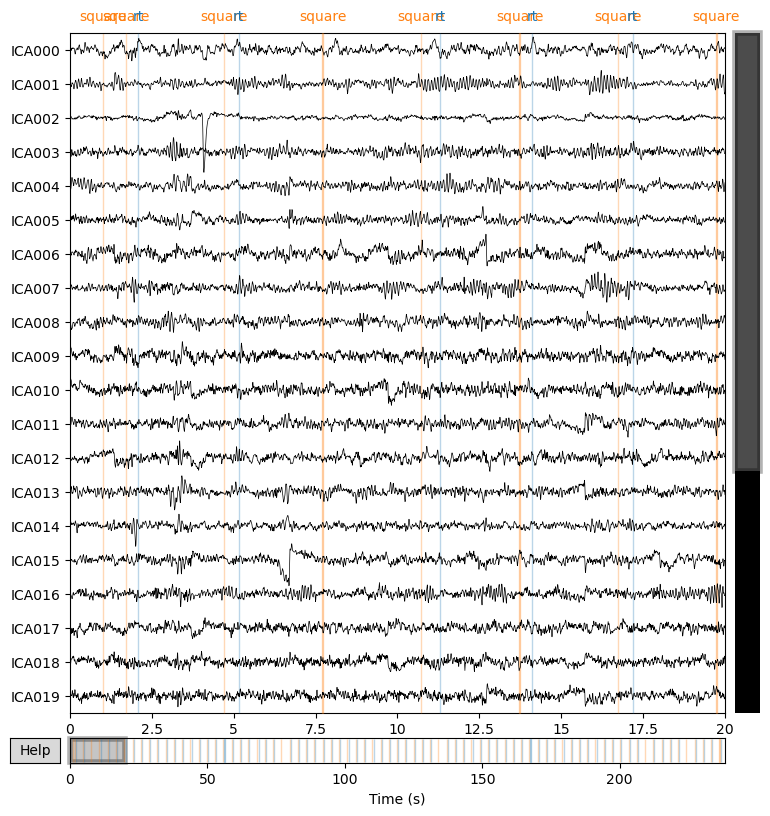

In [74]:
ica.plot_sources(raw_for_ica)

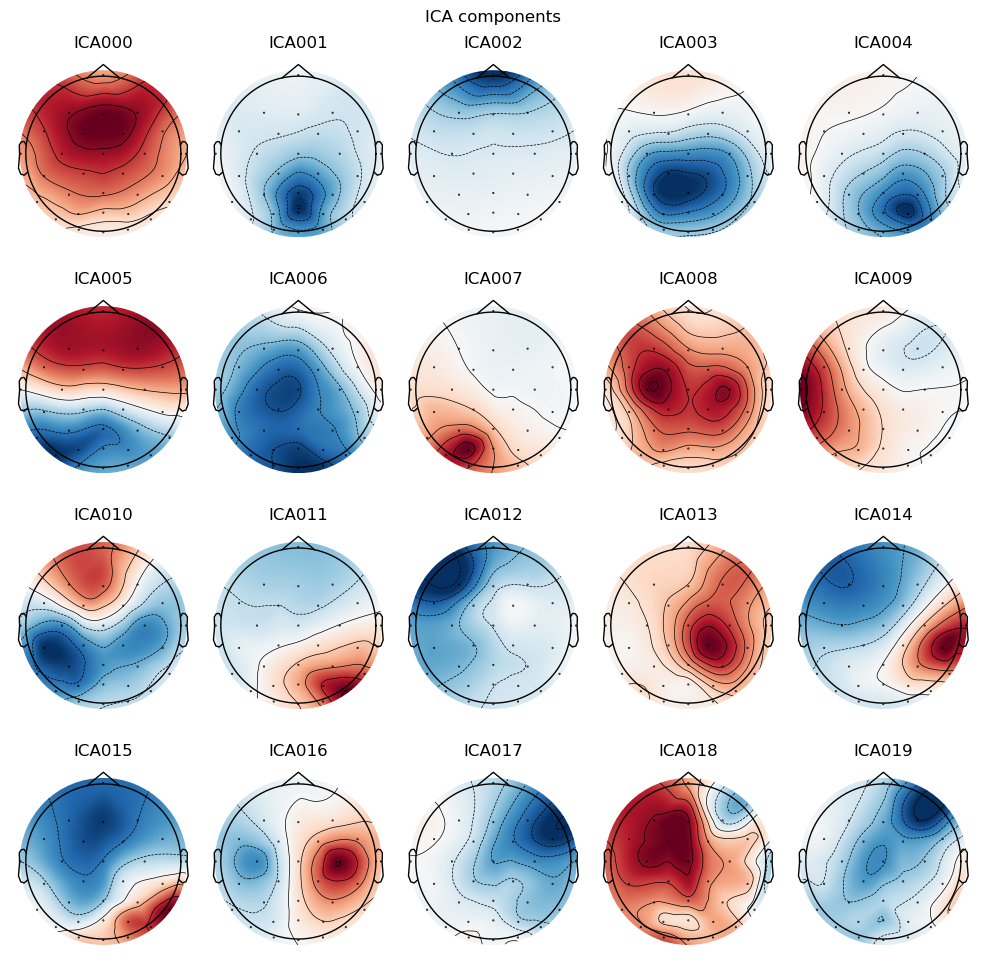

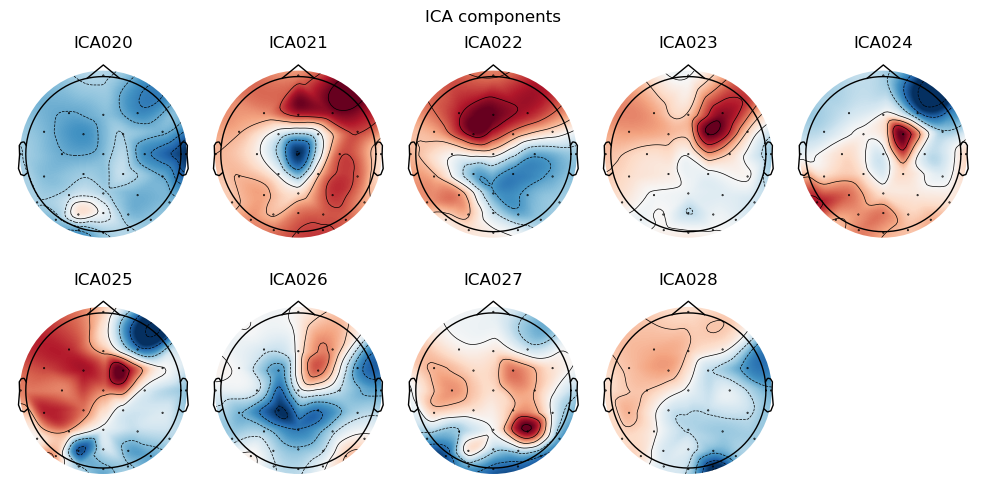

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 975x496 with 9 Axes>]

In [75]:
ica.plot_components()

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


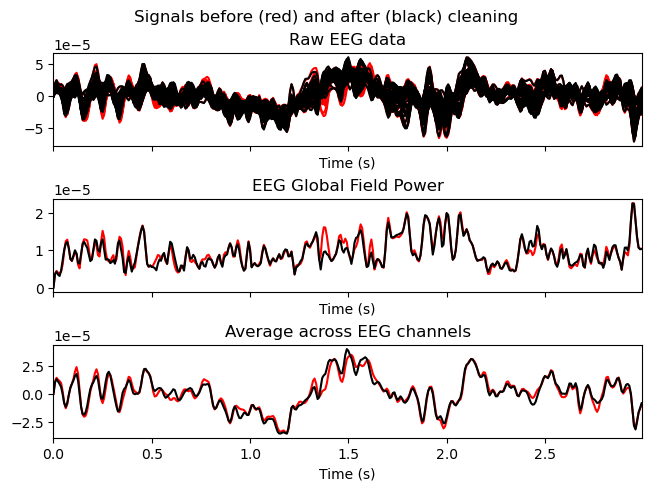

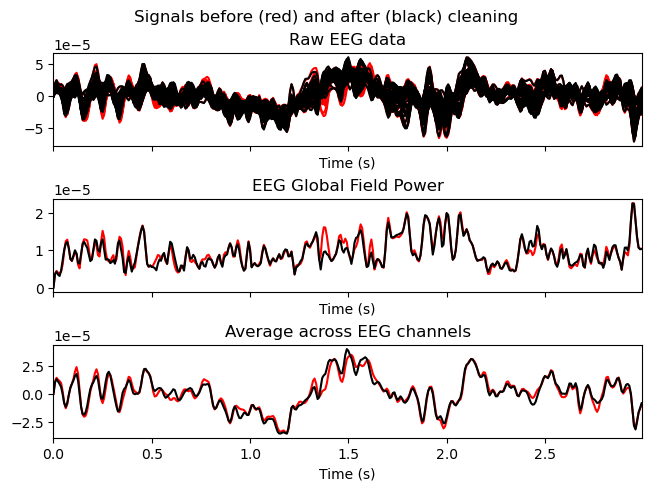

In [76]:
ica.plot_overlay(raw_for_ica, exclude=[1])

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
119 matching events found
No baseline correction applied
0 projection items activated


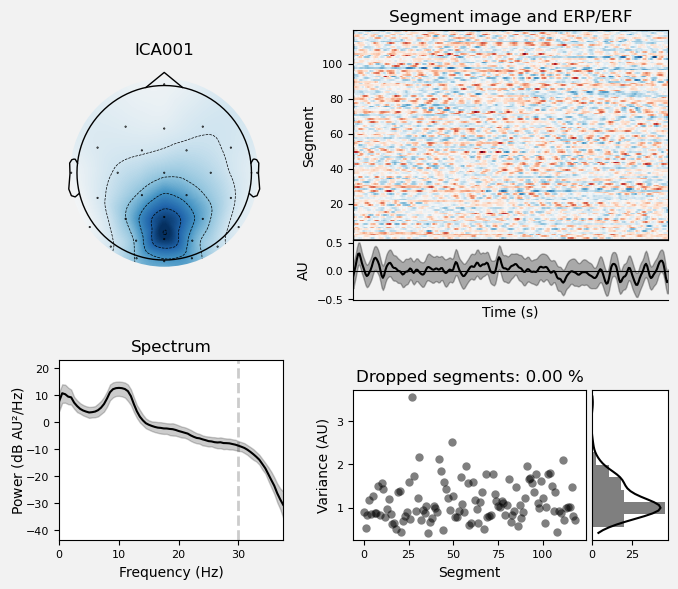

[<Figure size 700x600 with 6 Axes>]

In [77]:
ica.plot_properties(raw, picks=[1])

In [78]:
# 设定要删除的成分序号
ica.exclude = [1]
# 应⽤到脑电数据上
ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>

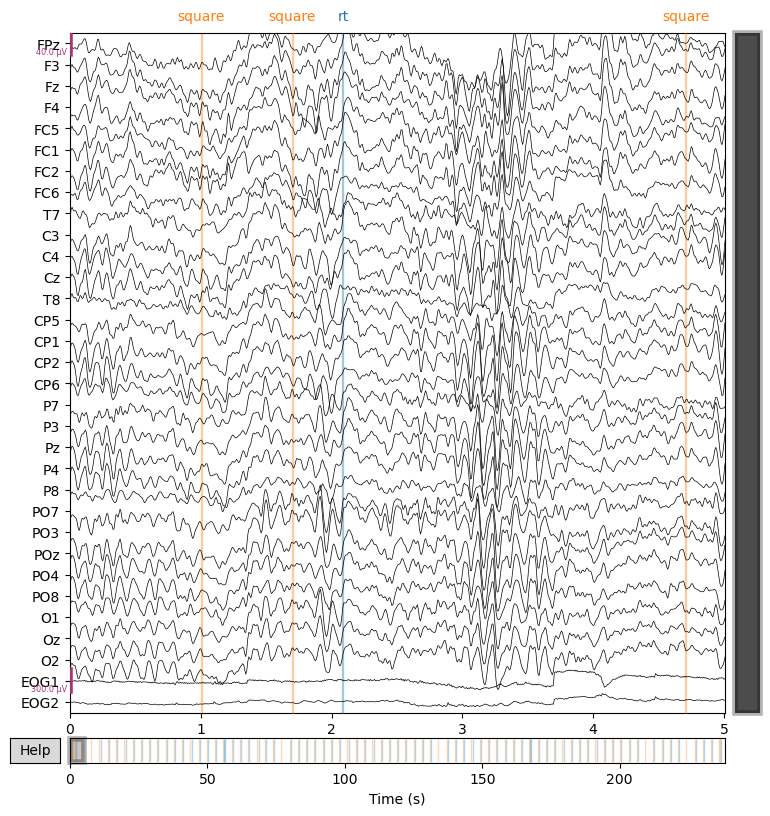

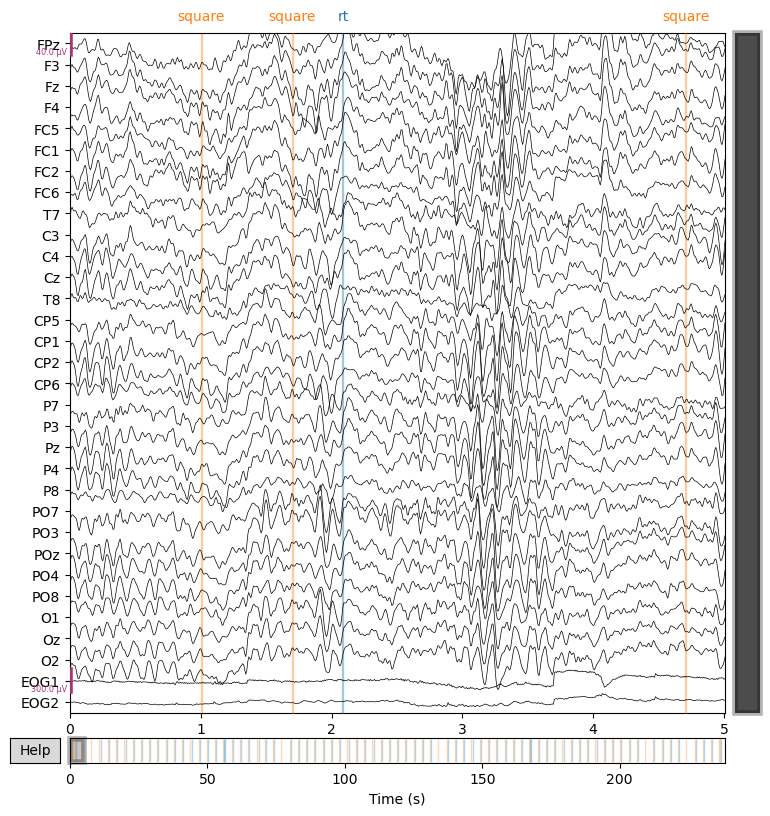

In [79]:
 raw.plot(duration=5, n_channels=32, clipping=None)

In [80]:
print(raw.annotations)

<Annotations | 154 segments: rt (74), square (80)>


In [81]:
# 基于Annotations打印数据的事件持续时⻓
print(raw.annotations.duration)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [82]:
# 基于Annotations打印数据的事件的描述信息
print(raw.annotations.description)

['square' 'square' 'rt' 'square' 'rt' 'square' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square'
 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square'
 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square'
 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'square' 'rt' 'sq

In [83]:
# 基于Annotations打印数据的事件的开始时间
print(raw.annotations.onset)

[  1.000068   1.695381   2.082407   4.703193   5.148224   7.711006
  10.718818  11.303858  13.726631  14.116658  16.734443  17.187474
  19.742256  20.199287  22.750068  23.136095  25.757881  26.124906
  28.765693  29.140719  31.773506  32.116529  34.781318  35.24635
  37.789131  38.254163  40.796943  41.229973  43.804756  44.30079
  46.812568  47.156592  49.820381  50.273412  52.828193  53.242222
  55.836006  56.211031  58.843818  59.237845  61.851631  62.183654
  64.859443  65.257471  67.867256  68.598306  70.875068  71.277096
  73.882881  74.323911  76.890693  79.898506  80.269531  82.906318
  83.312346  85.914131  86.313158  88.921943  89.280968  91.929756
  92.323783  94.937568  95.296593  97.945381  98.37141  100.953193
 101.363221 103.961006 104.332031 106.968818 107.343844 109.976631
 110.425662 112.984443 113.410472 115.992256 116.367281 119.000068
 119.359093 122.007881 122.409908 125.015693 125.441722 128.023506
 128.422533 131.031318 131.433346 134.039131 137.046943 137.4889

In [84]:
events, event_id = mne.events_from_annotations(raw)

Used Annotations descriptions: ['rt', 'square']


In [85]:
print(events.shape, event_id)

(154, 3) {'rt': 1, 'square': 2}


In [86]:
epochs = mne.Epochs(raw, events, event_id=2, tmin=-1, tmax=2, baseline=(-0.5, 0),
 preload=True, reject=dict(eeg=2e-4))

Not setting metadata
80 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 80 events and 385 original time points ...
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz', 'F3']
    Rejecting  epoch based on EEG : ['FPz', 'F3', 'Fz', 'F4']
    Rejecting  epoch based on EEG : ['FPz', 'F3', 'Fz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz', 'F3']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz', 'F3', 'Fz', 'F4', 'PO3']
    Rejecting  epoch based on EEG : ['FPz']
14 bad epochs dropped


In [87]:

print(epochs)

<Epochs | 66 events (all good), -1 – 2 s (baseline -0.5 – 0 s), ~6.2 MiB, data loaded,
 '2': 66>


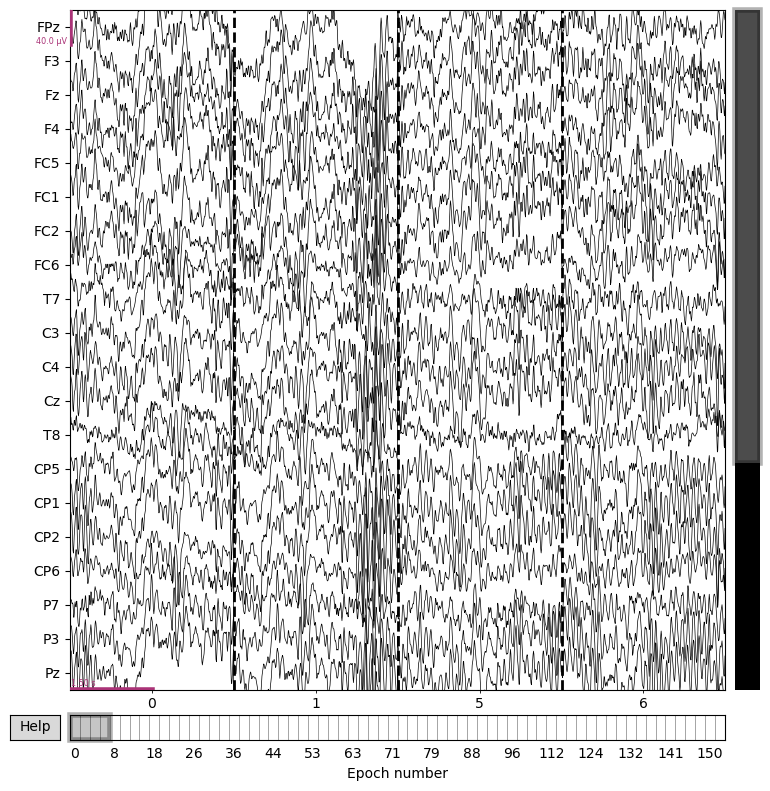

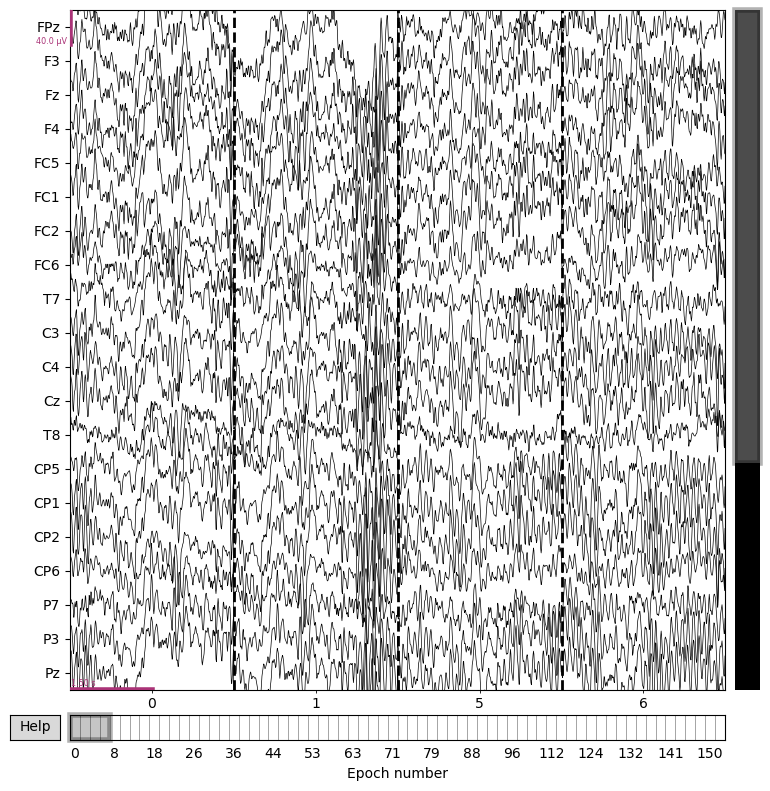

In [88]:
epochs.plot(n_epochs=4)

    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


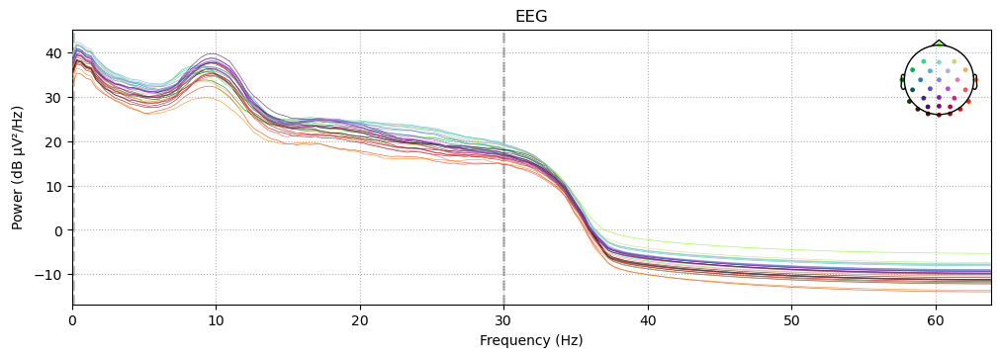

In [89]:
epochs.compute_psd().plot(picks='eeg')

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs before plotting...
converting legacy list-of-tuples input to a dict for the `bands` parameter


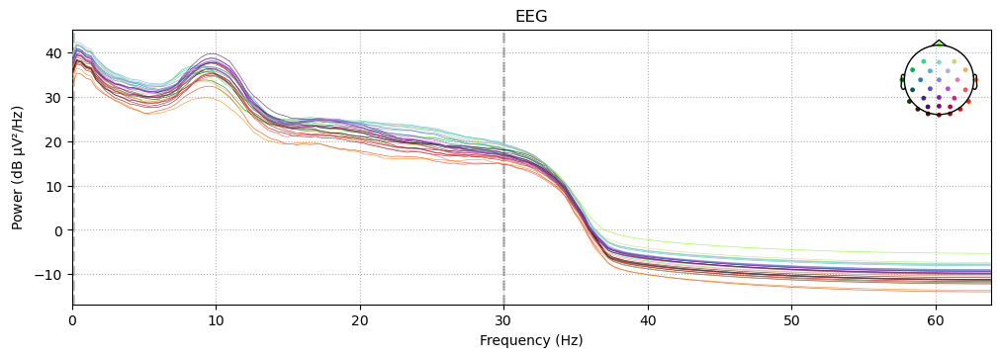

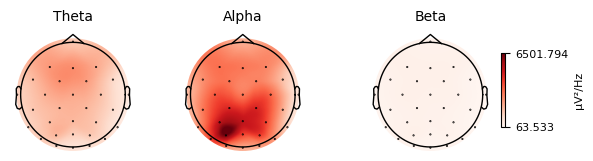

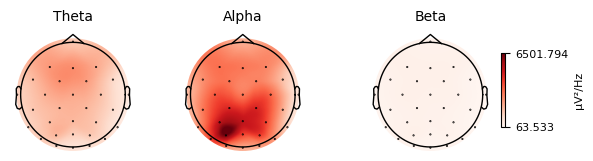

In [90]:
bands = [(4, 8, 'Theta'), (8, 12, 'Alpha'), (12, 30, 'Beta')]
epochs.plot_psd_topomap(bands=bands, vlim='joint')

In [91]:
evoked = epochs.average()

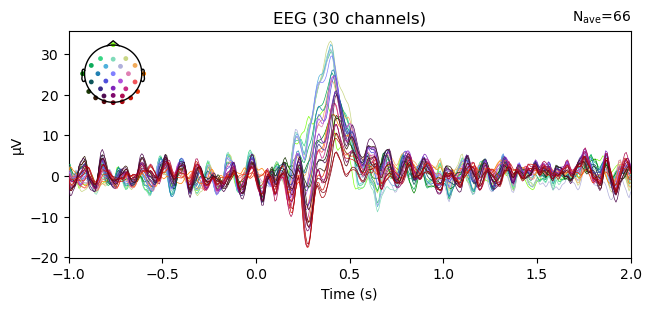

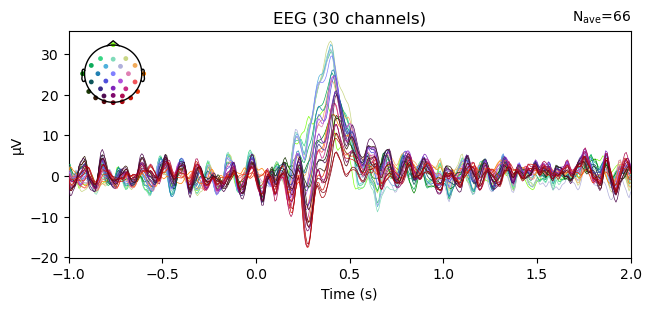

In [92]:

evoked.plot()

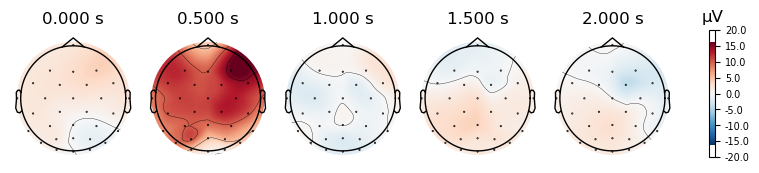

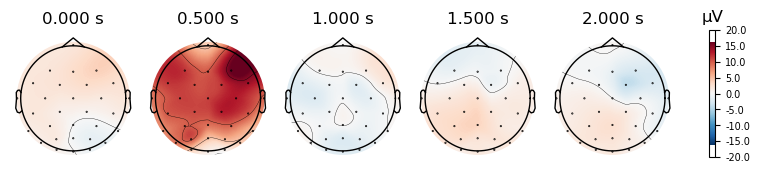

In [93]:
# 绘制0ms、0.5s、1s、1.5s和2s处的地形图
times = np.linspace(0, 2, 5)
evoked.plot_topomap(times=times, colorbar=True)

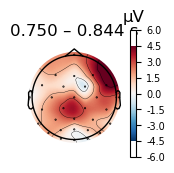

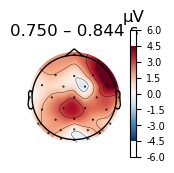

In [94]:
# 绘制某⼀特定时刻的地形图
# 此例绘制0.8s处，取0.75-0.85s的均值
evoked.plot_topomap(times=0.8, average=0.1)

No projector specified for this dataset. Please consider the method self.add_proj.


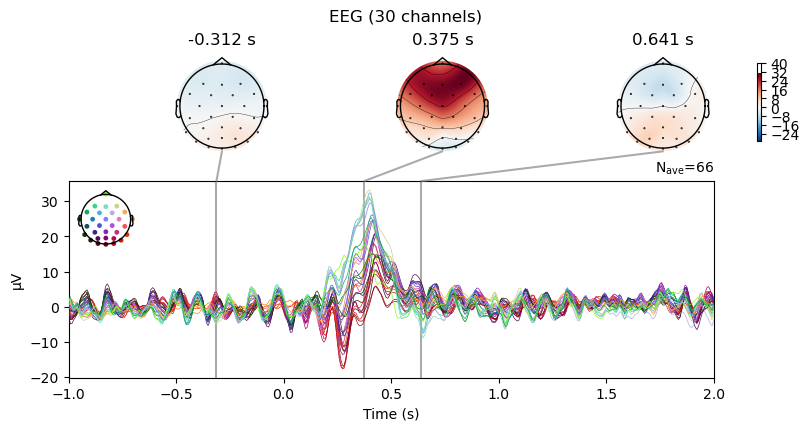

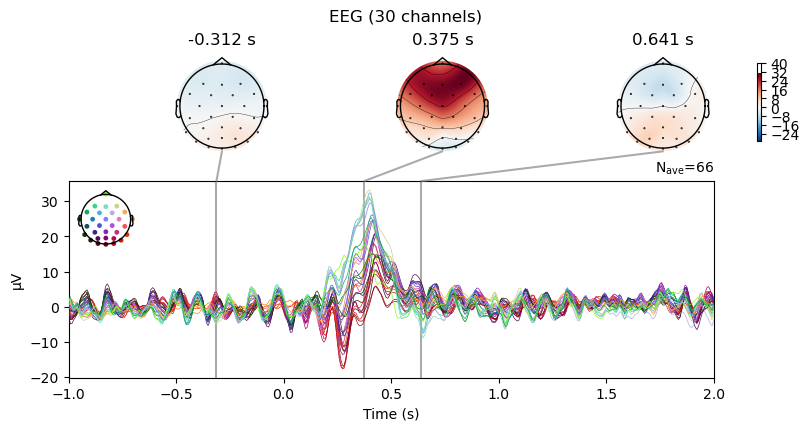

In [95]:

evoked.plot_joint()

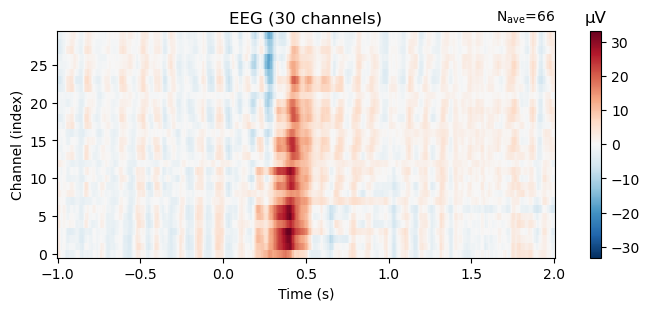

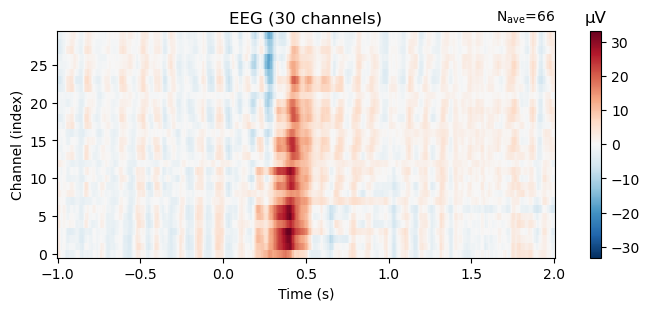

In [96]:
evoked.plot_image()

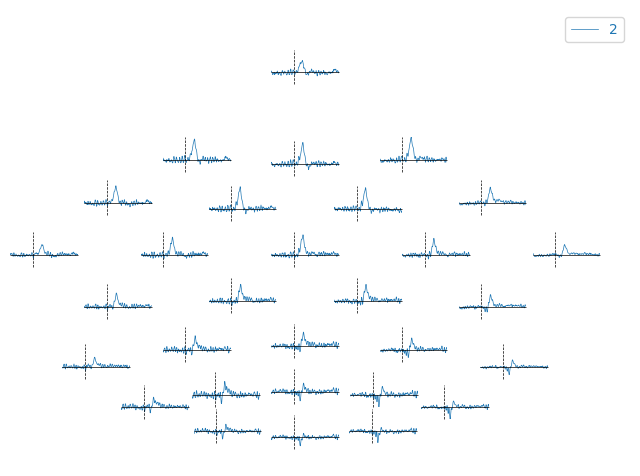

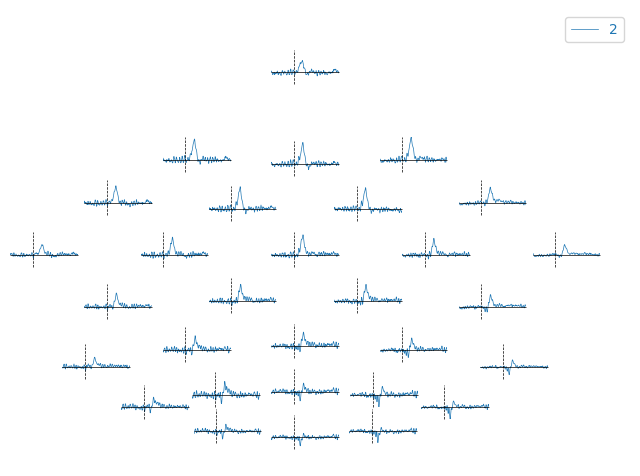

In [97]:

evoked.plot_topo()

combining channels using "mean"


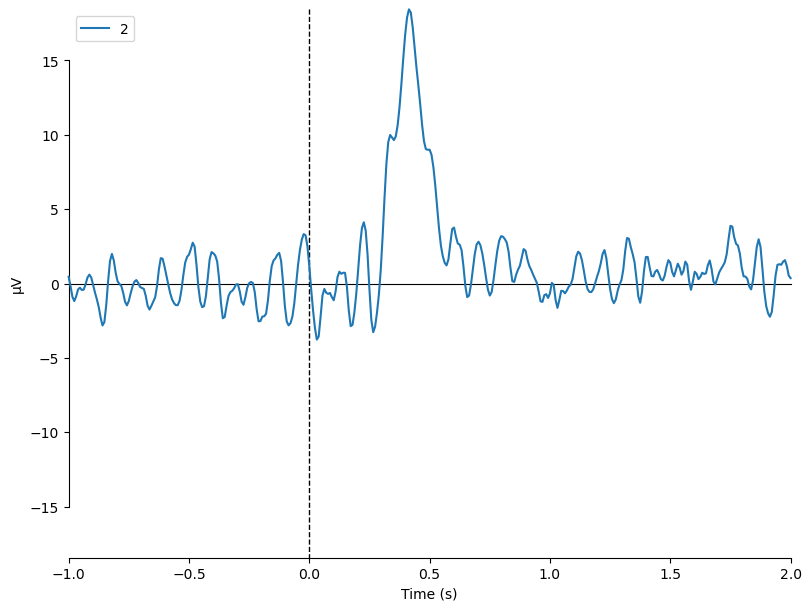

[<Figure size 800x600 with 1 Axes>]

In [98]:
mne.viz.plot_compare_evokeds(evokeds=evoked, combine='mean')

combining channels using "mean"


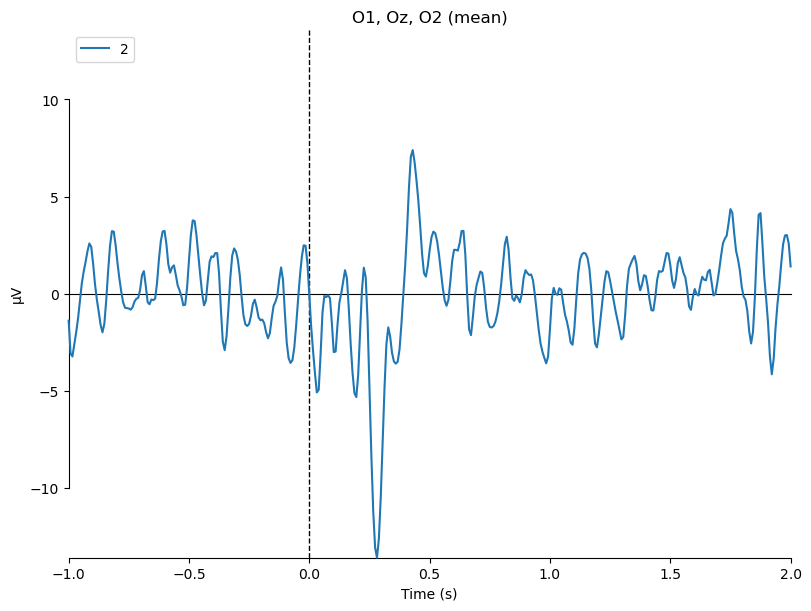

[<Figure size 800x600 with 1 Axes>]

In [99]:
mne.viz.plot_compare_evokeds(evokeds=evoked, picks=['O1', 'Oz', 'O2'], combine='mean')

In [100]:
# 设定⼀些时频分析的参数
# 频段选取4-30Hz
freqs = np.logspace(*np.log10([4, 30]), num=10)
n_cycles = freqs / 2.
power, itc = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, use_fft=True)

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Applying baseline correction (mode: logratio)


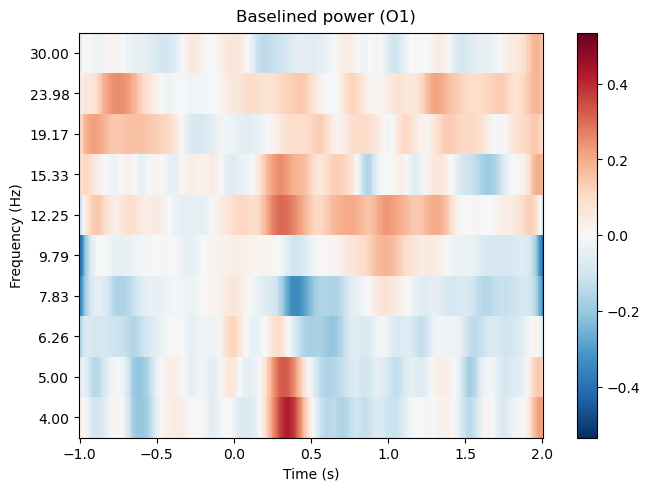

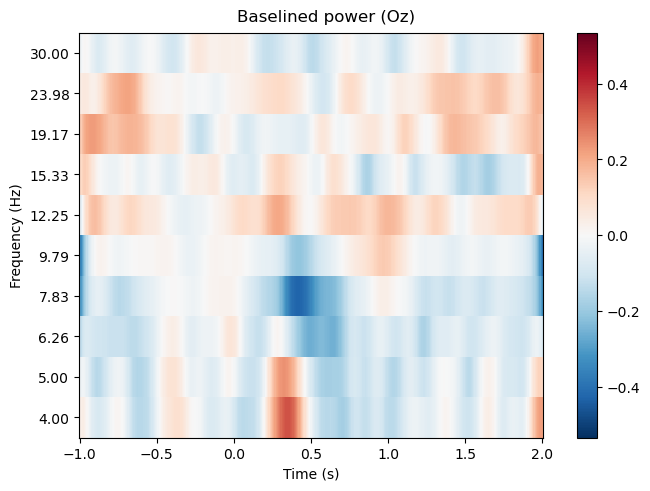

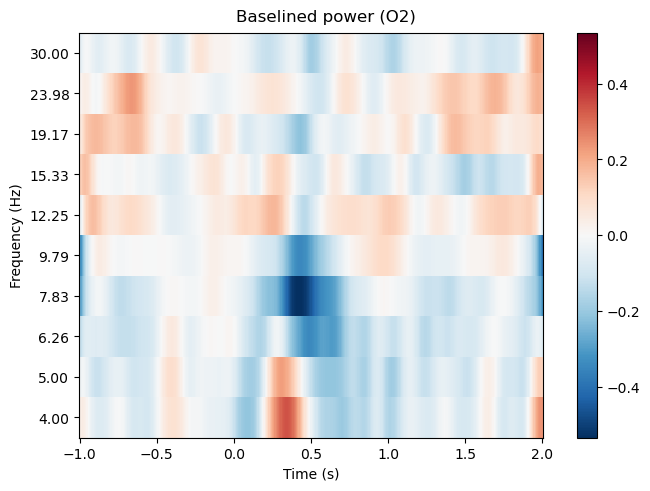

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [101]:
power.plot(picks=['O1', 'Oz', 'O2'], baseline=(-0.5, 0), mode='logratio', title='auto')

Applying baseline correction (mode: logratio)


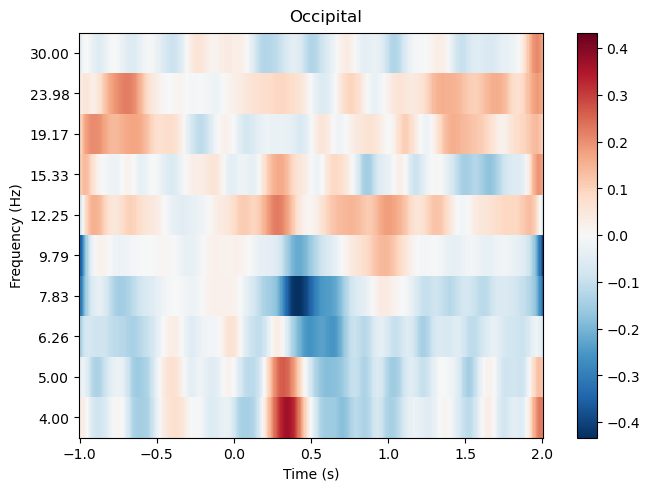

[<Figure size 640x480 with 2 Axes>]

In [102]:

power.plot(picks=['O1', 'Oz', 'O2'], baseline=(-0.5, 0), mode='logratio',
 title='Occipital', combine='mean')

Applying baseline correction (mode: logratio)


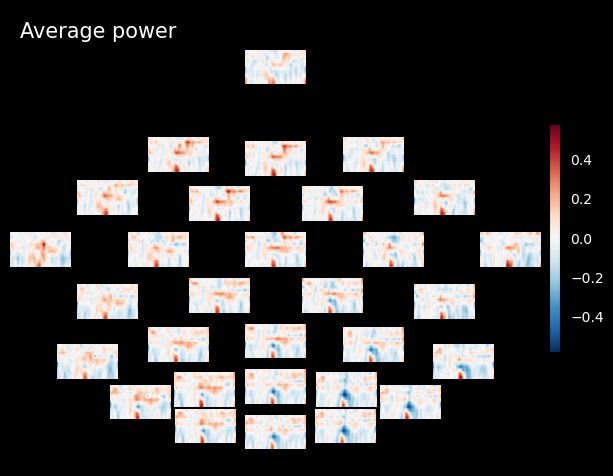

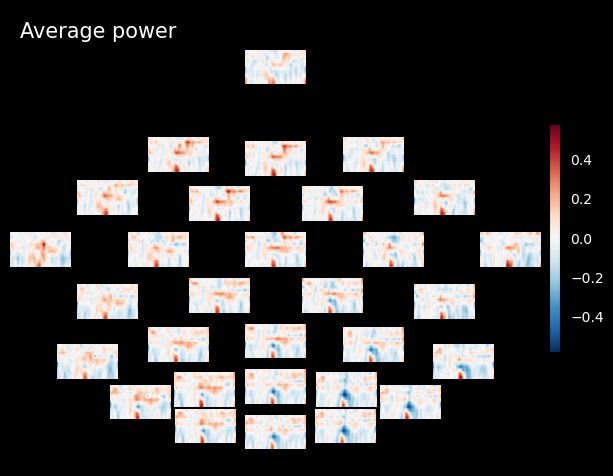

In [103]:
power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')

Applying baseline correction (mode: logratio)


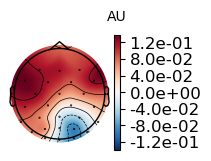

Applying baseline correction (mode: logratio)


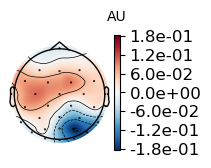

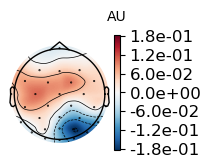

In [104]:
# 以theta power和alpha power为例
# 取0-0.5s的结果
power.plot_topomap(tmin=0, tmax=0.5, fmin=4, fmax=8,
 baseline=(-0.5, 0), mode='logratio')
power.plot_topomap(tmin=0, tmax=0.5, fmin=8, fmax=12,
 baseline=(-0.5, 0), mode='logratio')

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


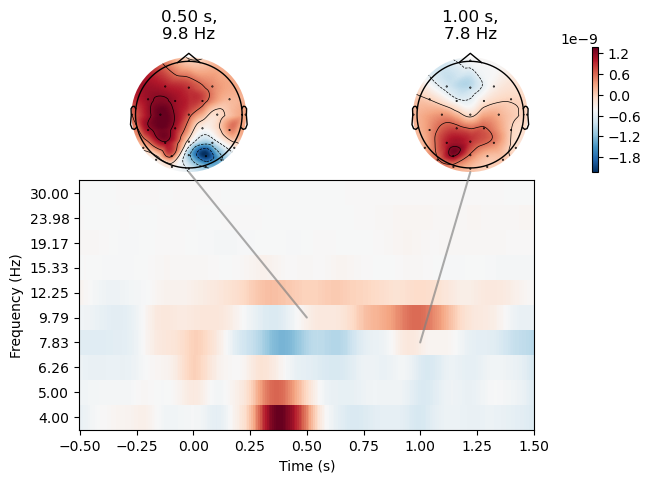

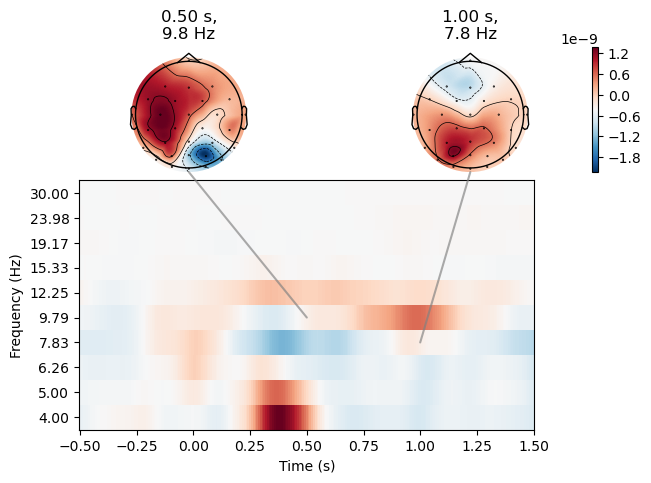

In [105]:
# 取-0.5s⾄1.5s的结果
# 并绘制0.5s时10Hz左右的结果和1s时8Hz左右的结果
power.plot_joint(baseline=(-0.5, 0), mode='mean', tmin=-0.5, tmax=1.5,
 timefreqs=[(0.5, 10), (1, 8)])

Applying baseline correction (mode: logratio)


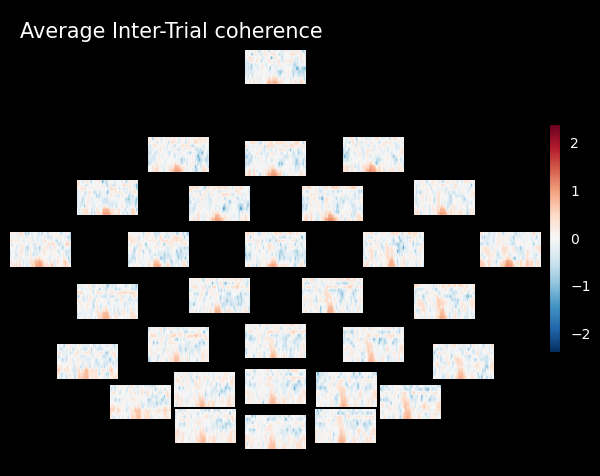

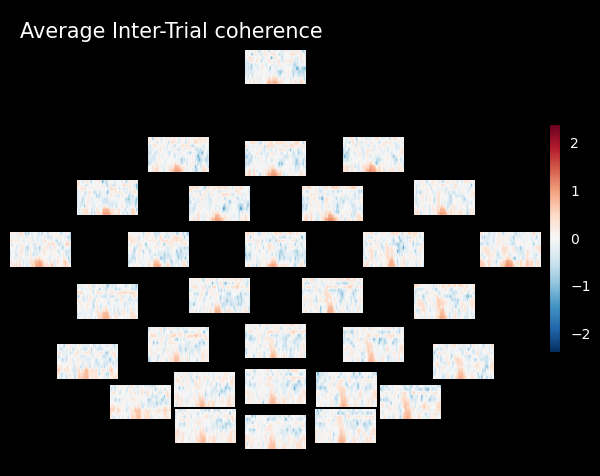

In [106]:

itc.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average Inter-Trial coherence')

In [107]:
epochs_array = epochs.get_data()

In [108]:

print(epochs_array.shape)
print(epochs_array)

(66, 32, 385)
[[[ 1.84392345e-05  2.90804871e-05  3.03807299e-05 ... -2.34250187e-05
   -2.22491309e-05 -2.11846944e-05]
  [ 1.90724252e-05  3.49982830e-05  1.52169891e-05 ... -6.16457047e-05
   -6.91169876e-05 -4.49072670e-05]
  [ 2.33993192e-05  3.71178622e-05  3.97653514e-05 ...  8.20116709e-06
    1.33241186e-05  1.60024021e-05]
  ...
  [ 9.70079380e-07  8.77375009e-06  1.21654239e-05 ...  3.42143118e-05
    3.15865703e-05  3.25635997e-05]
  [-1.80775550e-07  8.12824337e-06  1.06400334e-05 ...  2.77793218e-05
    2.58715194e-05  3.11464901e-05]
  [ 2.18313546e-06  1.31168514e-05  1.52108519e-05 ...  1.82668927e-05
    1.76791198e-05  2.77578216e-05]]

 [[-3.98130289e-05 -4.44658971e-05 -5.09957372e-05 ... -2.93615991e-05
   -2.97913082e-05 -1.28193144e-05]
  [-1.98700747e-05 -2.32499213e-05 -2.34376177e-05 ... -5.87000498e-05
   -6.47002100e-05 -5.75247492e-05]
  [-5.19046543e-05 -5.02570461e-05 -5.57455270e-05 ... -2.54754210e-05
   -2.54499084e-05 -1.30734525e-05]
  ...
  [-1.575

In [109]:

power_array = power.data

In [110]:
print(power_array.shape)
print(power_array)

(30, 10, 385)
[[[2.10103482e-09 2.14936053e-09 2.16772187e-09 ... 2.64422150e-09
   2.68670302e-09 2.68170032e-09]
  [1.63405278e-09 1.70382450e-09 1.75137679e-09 ... 1.91905408e-09
   1.92027897e-09 1.88855866e-09]
  [1.35727687e-09 1.44848059e-09 1.52539941e-09 ... 1.55512220e-09
   1.50845718e-09 1.44262944e-09]
  ...
  [1.63441479e-10 1.73452570e-10 1.82088167e-10 ... 1.48315914e-10
   1.44142018e-10 1.38619509e-10]
  [8.06650291e-11 8.38251429e-11 8.61914465e-11 ... 1.35115368e-10
   1.30132995e-10 1.23890033e-10]
  [7.95457169e-11 8.36402812e-11 8.68503367e-11 ... 9.88635411e-11
   9.64751797e-11 9.28973174e-11]]

 [[2.26410990e-09 2.36689388e-09 2.44720149e-09 ... 3.36075692e-09
   3.39110030e-09 3.36908086e-09]
  [1.82679598e-09 1.94506809e-09 2.04732667e-09 ... 2.53768045e-09
   2.51860831e-09 2.46272989e-09]
  [1.63672348e-09 1.78057420e-09 1.91519907e-09 ... 2.19693713e-09
   2.11396072e-09 2.00852479e-09]
  ...
  [2.06766439e-10 2.19236312e-10 2.29985392e-10 ... 2.04500821e

In [111]:
!pip install h5py
!pip install neurora
import numpy as np
import h5py
import scipy.io as sio
import matplotlib.pyplot as plt
from scipy.stats import ttest_1samp, ttest_ind, ttest_rel, f_oneway
from mne.stats import fdr_correction, f_mway_rm
from neurora.stuff import clusterbased_permutation_1d_1samp_1sided, permutation_test

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [112]:

# ⽣成shape为[3, 4]的全为0的矩阵
A = np.zeros([3, 4])
print(A.shape)
print(A)

(3, 4)
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [113]:
# ⽣成shape为[3, 4]的全为1的矩阵
A = np.ones([3, 4])
print(A.shape)
print(A)

(3, 4)
[[1. 1. 1. 1.]
 [1. 1. 1. 1.]
 [1. 1. 1. 1.]]


In [114]:
# ⽣成shape为[3, 4]的随机矩阵（随机值在0-1之间）
A = np.random.rand(3, 4)
print(A.shape)
print(A)

(3, 4)
[[0.1991933  0.40636984 0.18357417 0.63506606]
 [0.30645591 0.27505903 0.66792472 0.86079858]
 [0.59222912 0.28345118 0.24695153 0.2023601 ]]


In [115]:
# ⽣成shape为[3, 4]的随机矩阵（随机值在20-80之间）
A = np.random.uniform(low=20, high=80, size=[3, 4])
print(A.shape)
print(A)

(3, 4)
[[34.02546069 63.55406148 54.7479813  76.33475822]
 [69.02930562 46.20598054 44.67744028 24.39140818]
 [44.12300914 47.94303691 53.54021888 27.6555388 ]]


In [116]:
A = np.ravel(A)
print(A.shape)
print(A)

(12,)
[34.02546069 63.55406148 54.7479813  76.33475822 69.02930562 46.20598054
 44.67744028 24.39140818 44.12300914 47.94303691 53.54021888 27.6555388 ]


In [117]:
# 将A的shape修改为[3, 4]
A = np.reshape(A, (3, 4))
print(A.shape)
print(A)

(3, 4)
[[34.02546069 63.55406148 54.7479813  76.33475822]
 [69.02930562 46.20598054 44.67744028 24.39140818]
 [44.12300914 47.94303691 53.54021888 27.6555388 ]]


In [118]:

A = A.T
print(A.shape)
print(A)

(4, 3)
[[34.02546069 69.02930562 44.12300914]
 [63.55406148 46.20598054 47.94303691]
 [54.7479813  44.67744028 53.54021888]
 [76.33475822 24.39140818 27.6555388 ]]


In [119]:
# ⾸先，⽣成⼀个shape为[2, 3, 4]的三维数组
B = np.random.rand(2, 3, 4)
print(B.shape)
print(B)

(2, 3, 4)
[[[0.84248505 0.39949896 0.25336831 0.6801465 ]
  [0.35572175 0.30684205 0.42411401 0.49441919]
  [0.23342839 0.77681627 0.4399323  0.89300986]]

 [[0.35061473 0.53973097 0.28717474 0.91537337]
  [0.31794669 0.71757052 0.54562218 0.61232214]
  [0.42813377 0.74799543 0.04542393 0.87344897]]]


In [120]:
# 将A转置为shape为[2, 4, 3]的数组
B = np.transpose(B, (0, 2, 1))
print(B.shape)
print(B)

(2, 4, 3)
[[[0.84248505 0.35572175 0.23342839]
  [0.39949896 0.30684205 0.77681627]
  [0.25336831 0.42411401 0.4399323 ]
  [0.6801465  0.49441919 0.89300986]]

 [[0.35061473 0.31794669 0.42813377]
  [0.53973097 0.71757052 0.74799543]
  [0.28717474 0.54562218 0.04542393]
  [0.91537337 0.61232214 0.87344897]]]


In [121]:
# 这⾥是另外⼀个例⼦:
# 将shape为[2, 4, 3]的数组转置成shape为[4, 3, 2]的数组
B = np.transpose(B, (1, 2, 0))
print(B.shape)
print(B)

(4, 3, 2)
[[[0.84248505 0.35061473]
  [0.35572175 0.31794669]
  [0.23342839 0.42813377]]

 [[0.39949896 0.53973097]
  [0.30684205 0.71757052]
  [0.77681627 0.74799543]]

 [[0.25336831 0.28717474]
  [0.42411401 0.54562218]
  [0.4399323  0.04542393]]

 [[0.6801465  0.91537337]
  [0.49441919 0.61232214]
  [0.89300986 0.87344897]]]


In [122]:
# ⾸先，⽣成⼀个shape为[4, 3, 3]的数组
C = np.random.rand(4, 3, 3)
print(C.shape)
print(C)

(4, 3, 3)
[[[0.95977717 0.8392097  0.69778024]
  [0.28141445 0.43482455 0.26930591]
  [0.80512886 0.57659851 0.72387659]]

 [[0.64682506 0.06981087 0.00772768]
  [0.12551308 0.01377858 0.40608024]
  [0.3120049  0.68347609 0.09402829]]

 [[0.14837715 0.51286252 0.32975712]
  [0.26799978 0.29715851 0.30358241]
  [0.06682259 0.80706969 0.17152527]]

 [[0.34943088 0.58956867 0.75871642]
  [0.40719976 0.58737307 0.81835786]
  [0.32964739 0.34267618 0.92572249]]]


In [123]:

# 将数组B（shape为[4, 3, 2]）与数组C（shape为[4, 3, 3]）合并
# 即对第三个维度进⾏合并，合并后数组shape为[4, 3, 5]
D = np.concatenate((B, C), axis=2)
print(D.shape)
print(D)

(4, 3, 5)
[[[0.84248505 0.35061473 0.95977717 0.8392097  0.69778024]
  [0.35572175 0.31794669 0.28141445 0.43482455 0.26930591]
  [0.23342839 0.42813377 0.80512886 0.57659851 0.72387659]]

 [[0.39949896 0.53973097 0.64682506 0.06981087 0.00772768]
  [0.30684205 0.71757052 0.12551308 0.01377858 0.40608024]
  [0.77681627 0.74799543 0.3120049  0.68347609 0.09402829]]

 [[0.25336831 0.28717474 0.14837715 0.51286252 0.32975712]
  [0.42411401 0.54562218 0.26799978 0.29715851 0.30358241]
  [0.4399323  0.04542393 0.06682259 0.80706969 0.17152527]]

 [[0.6801465  0.91537337 0.34943088 0.58956867 0.75871642]
  [0.49441919 0.61232214 0.40719976 0.58737307 0.81835786]
  [0.89300986 0.87344897 0.32964739 0.34267618 0.92572249]]]


In [124]:
# 这⾥是另外⼀个例⼦:
# ⽣成⼀个shape为[1, 3, 2]的数组E
# 合并数组B和数组E，得到shape为[5, 3, 2]的数组F
E = np.random.rand(1, 3, 2)
F = np.concatenate((B, E), axis=0)
print(F.shape)
print(F)

(5, 3, 2)
[[[0.84248505 0.35061473]
  [0.35572175 0.31794669]
  [0.23342839 0.42813377]]

 [[0.39949896 0.53973097]
  [0.30684205 0.71757052]
  [0.77681627 0.74799543]]

 [[0.25336831 0.28717474]
  [0.42411401 0.54562218]
  [0.4399323  0.04542393]]

 [[0.6801465  0.91537337]
  [0.49441919 0.61232214]
  [0.89300986 0.87344897]]

 [[0.37860652 0.01902861]
  [0.97141845 0.43352545]
  [0.43591995 0.44146272]]]


In [125]:
# 对数组B（shape为[4, 3, 2]）的第⼆个维度的值进⾏平均
B_mean = np.average(B, axis=1)
print(B_mean.shape)
print(B_mean)

(4, 2)
[[0.47721173 0.36556506]
 [0.49438576 0.66843231]
 [0.37247154 0.29274028]
 [0.68919185 0.80038149]]


In [126]:
G = [[1, 2], [3, 4]]
G_narry = np.array(G)
print(type(G))
print(type(G_narry))

<class 'list'>
<class 'numpy.ndarray'>


In [127]:
# ⽣成⼀个数据，其shape为[4, 5]
testdata = np.random.rand(4, 5)
# 调⽤h5py，将数据存为⼀个名为'test_data.h5'⽂件
f = h5py.File('test_data.h5', 'w')
# 使⽤Key+dataset的⽅式存储上述testdata矩阵，这⾥Key命名为'data'
f.create_dataset('data', data=testdata)
# 关闭调⽤
f.close()

In [128]:
# 读取数据
testdata = np.array(h5py.File('test_data.h5', 'r')['data'])
# 打印数据信息
print(testdata.shape)
print(testdata)

(4, 5)
[[0.08362587 0.19730882 0.96754274 0.60107398 0.13870268]
 [0.76430088 0.41058011 0.33760426 0.20532579 0.43105641]
 [0.97922843 0.75555451 0.16854164 0.95411524 0.20703711]
 [0.18247139 0.35102155 0.62337203 0.99287076 0.12716704]]


In [129]:
# 将NumPy Array格式的testdata存成⼀个名为'test_data.npy'的⽂件
np.save('test_data.npy', testdata)
print(testdata.shape)
print(testdata)

(4, 5)
[[0.08362587 0.19730882 0.96754274 0.60107398 0.13870268]
 [0.76430088 0.41058011 0.33760426 0.20532579 0.43105641]
 [0.97922843 0.75555451 0.16854164 0.95411524 0.20703711]
 [0.18247139 0.35102155 0.62337203 0.99287076 0.12716704]]


In [130]:
# 将NumPy Array格式的testdata存成⼀个名为'test_data.txt'的⽂件
np.savetxt('test_data.txt', testdata)

In [131]:
testdata = np.loadtxt('test_data.txt')
# 打印数据信息
print(testdata.shape)
print(testdata)

(4, 5)
[[0.08362587 0.19730882 0.96754274 0.60107398 0.13870268]
 [0.76430088 0.41058011 0.33760426 0.20532579 0.43105641]
 [0.97922843 0.75555451 0.16854164 0.95411524 0.20703711]
 [0.18247139 0.35102155 0.62337203 0.99287076 0.12716704]]


In [132]:
# ⽣成⼀个shape为[2, 3, 4]的三维数组
testdata_3d = np.random.rand(2, 3, 4)
# reshape成[2, 12]
testdata_3d_to_2d = np.reshape(testdata_3d, (2, 12))
# 存为.txt⽂件
np.savetxt('test_data_3d_to_2d.txt', testdata_3d_to_2d)
# 读取数据
testdata_2d = np.loadtxt('test_data_3d_to_2d.txt')
# reshape成[2, 3, 4]
testdata_2d_to_3d = np.reshape(testdata_2d, (2, 3, 4))

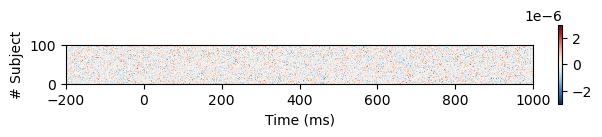

In [133]:
# ⽣成虚假脑电数据，其shape为[100, 1200]
data = np.random.uniform(low=-3e-6, high=3e-6, size=(100, 1200))
# 逐trial可视化
plt.imshow(data, extent=[-200, 1000, 0, 100], cmap='RdBu_r')
plt.colorbar(fraction=0.008, ticks=[-2e-6, 0, 2e-6])
plt.xlabel('Time (ms)')
plt.ylabel('# Subject')
plt.show()

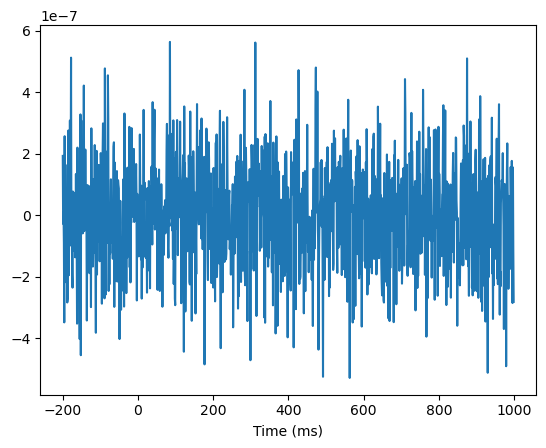

In [134]:
# 对100个被试平均
data_mean = np.mean(data, axis=0)
times = np.arange(-200, 1000)
# 对均值可视化
plt.plot(times, data_mean)
plt.xlabel('Time (ms)')
plt.show()

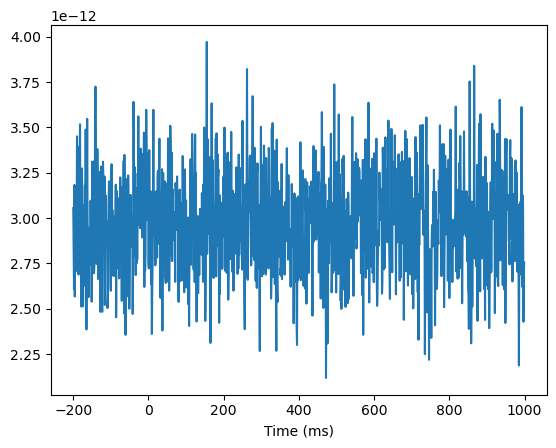

In [135]:
data_var = np.var(data, axis=0)
plt.plot(times, data_var)
plt.xlabel('Time (ms)')
plt.show()

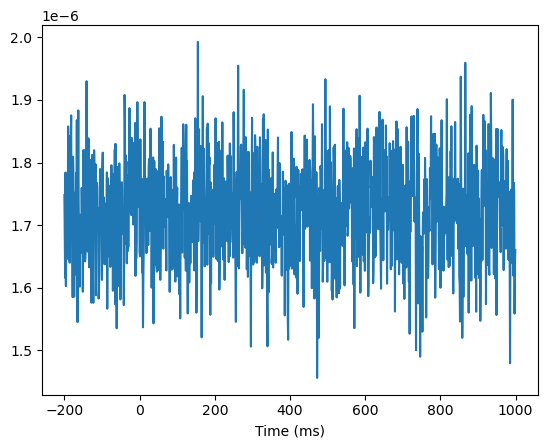

In [136]:
data_std = np.std(data, axis=0)
plt.plot(times, data_std)
plt.xlabel('Time (ms)')
plt.show()

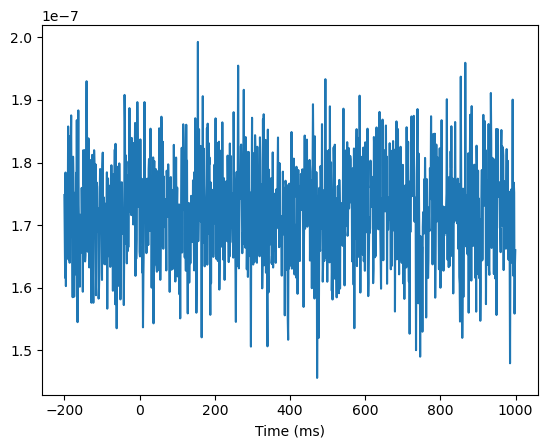

In [137]:
n_subjects = 100
data_sem = np.std(data, axis=0, ddof=0)/np.sqrt(n_subjects)
plt.plot(times, data_sem)
plt.xlabel('Time (ms)')
plt.show()

In [138]:
# ⽣成随机范围在-0.1到0.4之间的shape为[20, 1200]的数据
data = np.random.uniform(low=-0.5, high=0.55, size=(20, 1200))

(1200,)


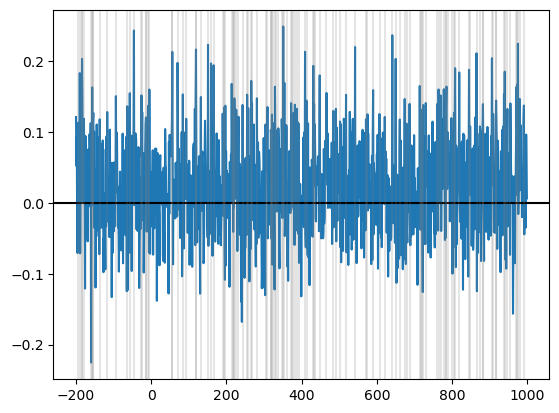

In [139]:

# 单样本t检验
t_vals, p_vals = ttest_1samp(data, 0, axis=0, alternative='greater')
# 打印出p_vals的shape：[1200]对应1200个时间点
print(np.shape(p_vals))
# 可视化统计检验后结果
# 阴影竖线代表显著的时间点
plt.plot(times, np.average(data, axis=0))
plt.axhline(y=0, color='black')
for i, p_val in enumerate(p_vals):
    if p_val < 0.05:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.show()

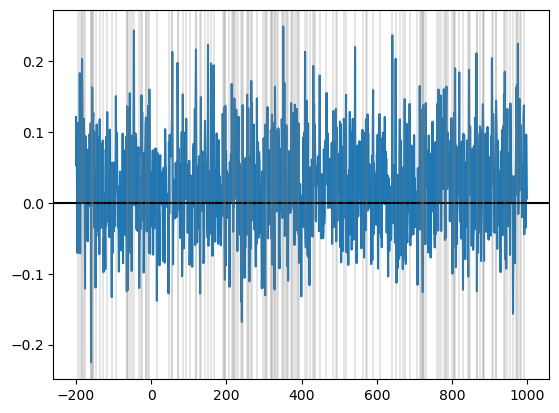

In [140]:
# 使⽤NeuroRA的stuff模块下的permutation_test()函数进⾏置换检验
# ⽣成⼀个shape为[20]的全0向量
zeros = np.zeros([20])
# 初始化⼀个p_vals⽤于存储计算得到的p值
p_vals = np.zeros([1200])
# 逐时间点计算p值
for t in range(1200):
 p_vals[t] = permutation_test(data[:, t], zeros)
# 可视化统计检验后结果
plt.plot(times, np.average(data, axis=0))
plt.axhline(y=0, color='black')
for i, p_val in enumerate(p_vals):
    if p_val < 0.05:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.show()

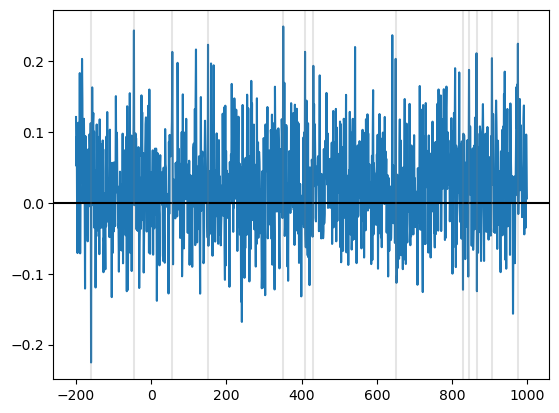

In [141]:

# Bonferrorni校正只需要把p值乘以进⾏统计检验的次数
# 这⾥即乘以时间点数
p_bf_corrected_vals = p_vals*len(times)
# 可视化经过矫正的统计检验结果
plt.plot(times, np.average(data, axis=0))
plt.axhline(y=0, color='black')
for i, p_val in enumerate(p_bf_corrected_vals):
    if p_val < 0.05:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.show()

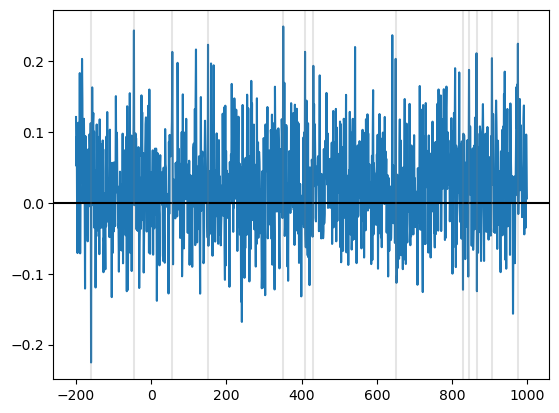

In [142]:
# FDR校正可以使⽤MNE中stats模块下的fdr_correlation()函数实现
# 其第⼀个返回值为是否通过矫正的布尔型数组（True为矫正后仍显著），第⼆个返回值为矫正后的p值
rejects, p_fdr_corrected_vals = fdr_correction(p_vals, alpha=0.05)
# 可视化经过矫正的统计检验结果
plt.plot(times, np.average(data, axis=0))
plt.axhline(y=0, color='black')
for i, p_val in enumerate(p_fdr_corrected_vals):
    if p_val < 0.05:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.show()


Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!



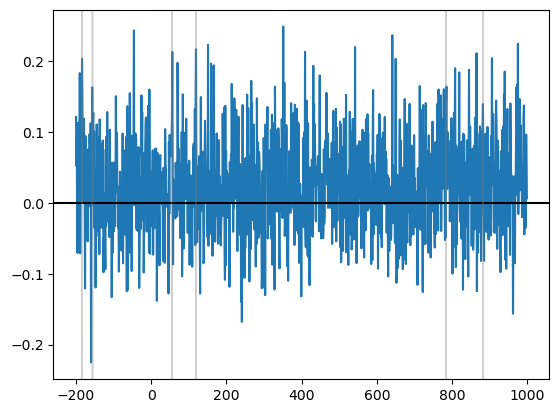

In [143]:
# 这⾥时序（1维）数据的单样本单边Cluster-based permutation test
# 可以通过NeuroRA中stuff模块下clusterbased_permutation_1d_1samp_1sided()函数实现
# 其需要输⼊的是⽤来做统计的数据（即这⾥的data），输出是是矫正后是否显著的矩阵（1为显著的点）
# 这⾥先使⽤p<0.05的阈值来选取clusters，对应参数设置为p_threshold=0.05
# 再⽤p<0.05的阈值来进⾏基于cluster的矫正，对应参数为clusterp_threshold=0.05
rejects = clusterbased_permutation_1d_1samp_1sided(data, level=0,
 p_threshold=0.05,
 clusterp_threshold=0.05)
# 可视化经过矫正的统计检验结果
plt.plot(times, np.average(data, axis=0))
plt.axhline(y=0, color='black')
for i, reject in enumerate(rejects):
    if reject == 1:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.show()

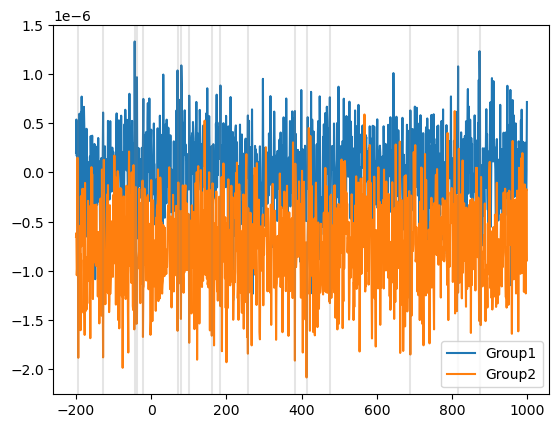

In [144]:
# ⽣成虚假（随机）数据
data1 = np.random.uniform(low=-3e-6, high=3e-6, size=(20, 1200))
data2 = np.random.uniform(low=-4e-6, high=2.5e-6, size=(18, 1200))
# 独⽴样本t检验
t_vals, p_vals = ttest_ind(data1, data2, axis=0)
# FDR矫正
rejects, p_fdr_corrected = fdr_correction(p_vals, alpha=0.05)
# 可视化经过矫正的统计检验结果
plt.plot(times, np.average(data1, axis=0), label='Group1')
plt.plot(times, np.average(data2, axis=0), label='Group2')
for i, reject in enumerate(rejects):
    if reject == True:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.legend()
plt.show()

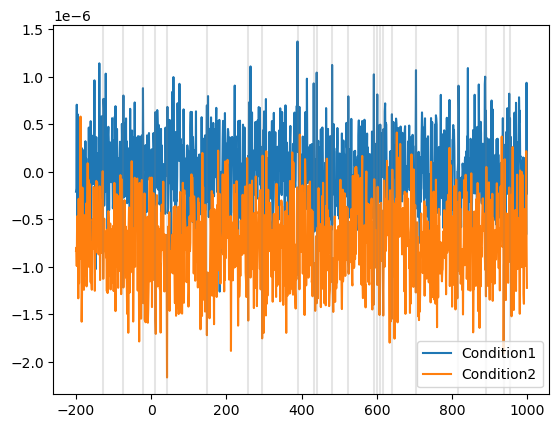

In [145]:
 
# ⽣成虚假（随机）数据
data1 = np.random.uniform(low=-3e-6, high=3e-6, size=(20, 1200))
data2 = np.random.uniform(low=-4e-6, high=2.5e-6, size=(20, 1200))
# 配对样本t检验
t_vals, p_vals = ttest_rel(data1, data2, axis=0)
# FDR矫正
rejects, p_fdr_corrected = fdr_correction(p_vals, alpha=0.05)
# 可视化经过矫正后的统计检验结果
plt.plot(times, np.average(data1, axis=0), label='Condition1')
plt.plot(times, np.average(data2, axis=0), label='Condition2')
for i, reject in enumerate(rejects):
    if reject == True:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.legend()
plt.show()

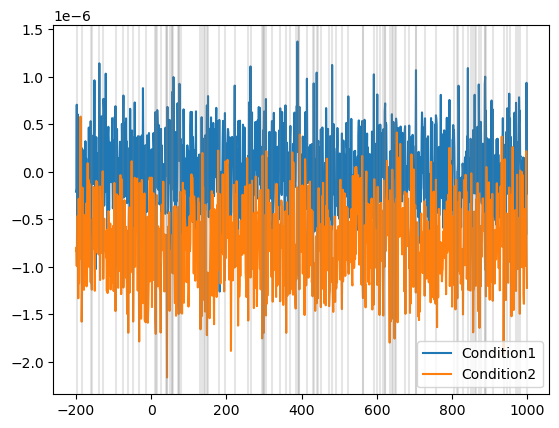

In [146]:
# 初始化⼀个p_vals⽤于存储计算得到的p值
p_vals = np.zeros([1200])
# 逐时间点计算p值
for t in range(1200):
 p_vals[t] = permutation_test(data1[:, t], data2[:, t])
# FDR矫正
rejects, p_fdr_corrected = fdr_correction(p_vals, alpha=0.05)
# 可视化经过矫正的统计检验结果
plt.plot(times, np.average(data1, axis=0), label='Condition1')
plt.plot(times, np.average(data2, axis=0), label='Condition2')
for i, reject in enumerate(rejects):
    if reject == 1:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.legend()
plt.show()

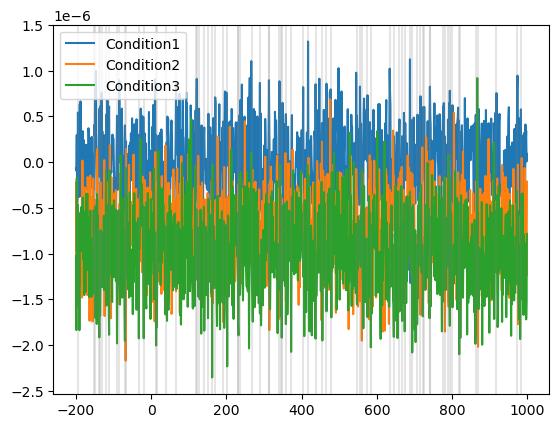

In [147]:
# ⽣成虚假（随机）数据
data1 = np.random.uniform(low=-3e-6, high=3e-6, size=(20, 1200))
data2 = np.random.uniform(low=-4e-6, high=2.5e-6, size=(20, 1200))
data3 = np.random.uniform(low=-4.5e-6, high=2.5e-6, size=(20, 1200))
# 单因素F检验
f_vals, p_vals = f_oneway(data1, data2, data3, axis=0)
# FDR矫正
rejects, p_fdr_corrected = fdr_correction(p_vals, alpha=0.05)
# 可视化经过矫正的统计检验结果
plt.plot(times, np.average(data1, axis=0), label='Condition1')
plt.plot(times, np.average(data2, axis=0), label='Condition2')
plt.plot(times, np.average(data3, axis=0), label='Condition3')
for i, reject in enumerate(rejects):
    if reject == True:
        plt.axvline(x=times[i], color='grey', alpha=0.2)
plt.legend()
plt.show()

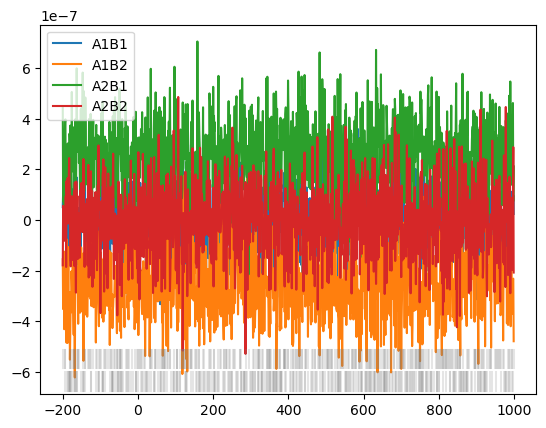

In [148]:
# ⽣成虚假（随机）数据
data_A1B1 = np.random.uniform(low=-3e-6, high=3e-6, size=(200, 1200))
data_A1B2 = np.random.uniform(low=-3.5e-6, high=3e-6, size=(200, 1200))
data_A2B1 = np.random.uniform(low=-3e-6, high=3.5e-6, size=(200, 1200))
data_A2B2 = np.random.uniform(low=-3.5e-6, high=3.5e-6, size=(200, 1200))
# ⾸先对数据进⾏reshape⽅便后续合并
reshaped_A1B1 = data_A1B1.reshape(200, 1, 1200)
reshaped_A1B2 = data_A1B2.reshape(200, 1, 1200)
reshaped_A2B1 = data_A2B1.reshape(200, 1, 1200)
reshaped_A2B2 = data_A2B2.reshape(200, 1, 1200)
#把数据按照两个因素的顺序（A1B1、A1B2、A2B1、A2B2）合并
data_combine = np.concatenate((reshaped_A1B1, reshaped_A1B2,
 reshaped_A2B1, reshaped_A2B2), axis=1)
# 设置变量⽔平
factor_levels = [2, 2]
# 使⽤MNE的f_mway_rm函数进⾏2×2⽅差分析
# 变量A的主效应
f_main_A, p_main_A = f_mway_rm(data_combine, factor_levels, effects='A')
# 变量B的主效应
f_main_B, p_main_B = f_mway_rm(data_combine, factor_levels, effects='B')
# 交互效应
f_inter, p_interaction = f_mway_rm(data_combine, factor_levels, effects='A:B')
# FDR矫正
rejects_A, p_main_A = fdr_correction(p_main_A, alpha=0.05)
rejects_B, p_main_B = fdr_correction(p_main_B, alpha=0.05)
rejects_inter, p_interaction = fdr_correction(p_interaction, alpha=0.05)
# 可视化经过矫正的统计检验结果
# 图⽚下⽅三⾏灰⾊竖线，有下⾄上分别代表A主效应、B主效应和交互效应显著的时间点
plt.plot(times, np.average(data_A1B1, axis=0), label='A1B1')
plt.plot(times, np.average(data_A1B2, axis=0), label='A1B2')
plt.plot(times, np.average(data_A2B1, axis=0), label='A2B1')
plt.plot(times, np.average(data_A2B2, axis=0), label='A2B2')
for i in range(1200):
    if p_main_A[i] < 0.05:
        plt.axvline(x=times[i], ymin=0.01, ymax=0.06, color='grey', alpha=0.2)
    if p_main_B[i] < 0.05:
        plt.axvline(x=times[i], ymin=0.07, ymax=0.12, color='grey', alpha=0.2)
    if p_interaction[i] < 0.05:
        plt.axvline(x=times[i], ymin=0.13, ymax=0.18, color='grey', alpha=0.2)
plt.legend()
plt.show()

In [184]:
! pip install gdown
import numpy as np
import os
import gdown
import zipfile
import h5py
import scipy.io as sio
import matplotlib.pyplot as plt
from scipy.stats import ttest_1samp, ttest_rel
from mne.stats import fdr_correction, f_mway_rm
from neurora.stuff import clusterbased_permutation_1d_1samp_1sided, \
                          permutation_test, \
                          clusterbased_permutation_2d_1samp_2sided, \
                          clusterbased_permutation_2d_2sided
from mne.time_frequency import tfr_array_morlet

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [182]:
data_dir = "data/"
if not os.path.exists(data_dir):
 os.makedirs(data_dir)
# 从Google Drive下载
url = "https://drive.google.com/file/d/1hsPmIFod3c7ZR0YdyO8woqUfqO_3pZtR/view?usp=sharing"
filename = "demo_data1"
filepath = data_dir + filename + ".zip"
# 下载数据
gdown.download(url=url, output=filepath, quiet=False, fuzzy=True)
print("Download completes!")
# 解压数据
with zipfile.ZipFile(filepath, 'r') as zip:
 zip.extractall(data_dir)
print("Unzip completes!")

Downloading...
From (original): https://drive.google.com/uc?id=1hsPmIFod3c7ZR0YdyO8woqUfqO_3pZtR
From (redirected): https://drive.google.com/uc?id=1hsPmIFod3c7ZR0YdyO8woqUfqO_3pZtR&confirm=t&uuid=366a914e-439c-4bfa-b408-040a8e290b4e
To: /Users/chenbohan/Desktop/data/demo_data1.zip
100%|████████████████████████████████████████| 242M/242M [00:36<00:00, 6.57MB/s]


Download completes!
Unzip completes!


In [187]:
# 对8个被试的数据进⾏遍历
for sub in range(8):
 # 获取每个被试的两个条件下的.mat⽂件地址
 subdata_first_path = 'data/demo_data1/sub' + str(sub + 1) + '_first.mat'
 subdata_rep_path = 'data/demo_data1/sub' + str(sub + 1) + '_rep.mat'
 # 通过.mat⽂件提取数据
 # 数据shape为[n_channels, n_times, n_trials]
 subdata_first = sio.loadmat(subdata_first_path)['data']
 subdata_rep = sio.loadmat(subdata_rep_path)['data']
 # 由于导联中有四个导联是眼电导联，需要进⾏删去
 subdata_first = np.delete(np.array(subdata_first), [60, 61, 62, 63], axis=0)
 subdata_rep = np.delete(np.array(subdata_rep), [60, 61, 62, 63], axis=0)
 # 打印被试编号及熟悉⾯孔第⼀看到和紧接着重复看到两条件下的脑电矩阵shape
 print('sub' + str(sub + 1))
 print(subdata_first.shape)
 print(subdata_rep.shape)
 # 将每个被试两刺激条件下的脑电数据（矩阵形式）以‘data’和'data_rep'为Keys存在⼀个.h5⽂件⾥
 f = h5py.File('data/demo_data1/sub' + str(sub + 1) + '.h5', 'w')
 f.create_dataset('data_first', data=subdata_first)
 f.create_dataset('data_rep', data=subdata_rep)
 f.close()

sub1
(70, 500, 150)
(70, 500, 78)
sub2
(70, 500, 150)
(70, 500, 79)
sub3
(70, 500, 150)
(70, 500, 74)
sub4
(70, 500, 150)
(70, 500, 68)
sub5
(70, 500, 150)
(70, 500, 67)
sub6
(70, 500, 150)
(70, 500, 70)
sub7
(70, 500, 150)
(70, 500, 77)
sub8
(70, 500, 150)
(70, 500, 70)


In [207]:

# 初始化2个变量分别存储每个被试两条件下的ERP
# 8 - n_subjects, 300 - n_times （-200ms到1000ms）
erp_first = np.zeros([8, 300])
erp_rep = np.zeros([8, 300])
# 逐被试迭代
for sub in range(8):
 # 读取该被试的数据
    with h5py.File('data/demo_data1/sub' + str(sub + 1) + '.h5', 'r') as f:
        subdata_first = np.array(f['data_first'])
        subdata_rep = np.array(f['data_rep'])
        f.close()
 # subdata和subdata_rep的shape均为[n_channels, n_times, n_trials]
 # 选取第50个导联的数据，平均试次，并取-200ms到1000ms
    erp_first[sub] = np.average(subdata_first[49], axis=1)[75:375]
    erp_rep[sub] = np.average(subdata_rep[49], axis=1)[75:375]
 # 基线校正，取基线为-100到0ms
    erp_first[sub] = erp_first[sub] - np.average(erp_first[sub, 25:50])
    erp_rep[sub] = erp_rep[sub] - np.average(erp_rep[sub, 25:50])

In [209]:

def plot_erp_results(erp, times, ylim=[-10, 10], labelpad=0):
    n_subjects = np.shape(erp)[0]
# 平均ERPs
    avg = np.average(erp, axis=0)
 # 计算逐时间点的SEM
    err = np.std(erp, axis=0, ddof=0)/np.sqrt(n_subjects)
 
    ax = plt.gca()
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(3)
    ax.spines["left"].set_position(("data", 0))
    ax.spines["bottom"].set_linewidth(3)
    ax.spines['bottom'].set_position(('data', 0))
 # 绘制ERP
    plt.fill_between(times, avg+err, avg-err, alpha=0.2)
    plt.plot(times, avg, alpha=0.9)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.ylabel(r'Amplitude in $\mu$V', fontsize=16, labelpad=labelpad)
    plt.xlabel('Time (s)', fontsize=16)
    plt.ylim(ylim[0], ylim[1])
    plt.show()

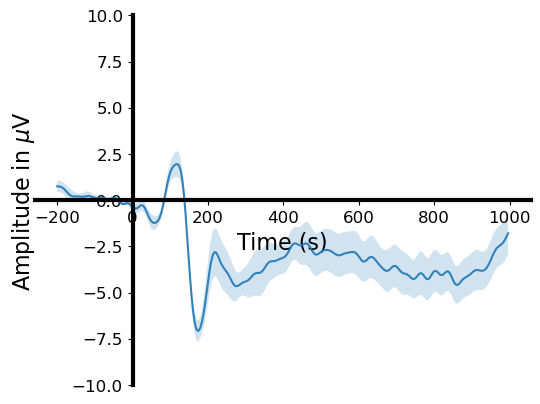

In [211]:
times = np.arange(-200, 1000, 4)
plot_erp_results(erp_first, times, labelpad=25)

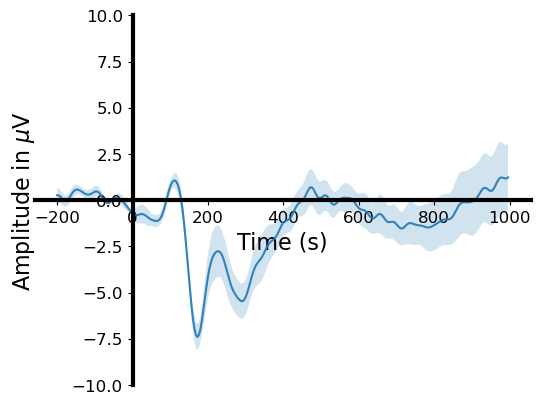

In [213]:
plot_erp_results(erp_rep, times, labelpad=25)

In [215]:
def plot_erp_2cons_results(erp1, erp2, times, con_labels=['Condition1', 'Condition2'], ylim=[-10, 10], p_threshold=0.05, labelpad=0):
 
    n_subjects = np.shape(erp1)[0]
 # 平均ERPs
    avg1 = np.average(erp1, axis=0)
    avg2 = np.average(erp2, axis=0)
 # calcualte the SEM for each time-point
    err1 = np.std(erp1, axis=0, ddof=0)/np.sqrt(n_subjects)
    err2 = np.std(erp2, axis=0, ddof=0)/np.sqrt(n_subjects)
 # 统计分析
    t_vals, p_vals = ttest_rel(erp1, erp2, axis=0)
 # FDR矫正
 # rejects, p_fdr_corrected = fdr_correction(p_vals, alpha=p_threshold)
 
    ax = plt.gca()
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(3)
    ax.spines["left"].set_position(("data", 0))
    ax.spines["bottom"].set_linewidth(3)
    ax.spines['bottom'].set_position(('data', 0))
 
 # 标记显著时间窗
    tstep = (times[-1]-times[0])/len(times)
    for i, p_val in enumerate(p_vals):
        if p_val < 0.05:
            plt.fill_between([times[i], times[i]+tstep], [ylim[1]], [ylim[0]],
                             facecolor='gray', alpha=0.1)
 # 绘制带统计结果的ERP
    plt.fill_between(times, avg1+err1, avg1-err1, alpha=0.2, label=con_labels[0])
    plt.fill_between(times, avg2+err2, avg2-err2, alpha=0.2, label=con_labels[1])
    plt.plot(times, avg1, alpha=0.9)
    plt.plot(times, avg2, alpha=0.9)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.ylim(ylim[0], ylim[1])
    plt.ylabel(r'Amplitude in $\mu$V', fontsize=16, labelpad=labelpad)
    plt.xlabel('Time (s)', fontsize=16)
    plt.legend()
    plt.show()

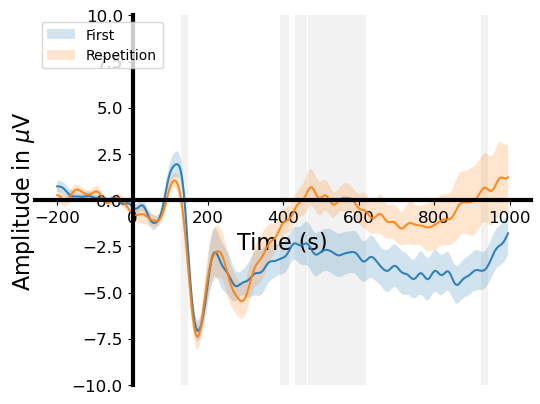

In [217]:
plot_erp_2cons_results(erp_first, erp_rep, times, con_labels=['First', 'Repetition'],
                       p_threshold=0.05, labelpad=25)

In [219]:
# 初始化2个变量分别存储每个被试两条件下的时频分析结果
# 8 - n_subjects, 70 - n_channels, 14 - n_freqs， 500 - n_times
tfr_first = np.zeros([8, 70, 14, 500])
tfr_rep = np.zeros([8, 70, 14, 500])
# 逐被试迭代
for sub in range(8):
 # 读取该被试的数据
    with h5py.File('data/demo_data1/sub' + str(sub + 1) + '.h5', 'r') as f:
        subdata_first = np.array(f['data_first'])
        subdata_rep = np.array(f['data_rep'])
        f.close()
 # 数据的shape从[n_channels, n_times, n_trials]转换成[n_trials, n_channels, n_times]
    subdata_first = np.transpose(subdata_first, (2, 0, 1))
    subdata_rep = np.transpose(subdata_rep, (2, 0, 1))
 # 设定⼀些时频分析的参数
 # 频段选取4-30Hz
    freqs = np.arange(4, 32, 2)
    n_cycles = freqs / 2.
 # 时频分析
 # 使⽤MNE的time_frequency模块下的tfr_arrayy_morlet()函数
 # 其输⼊为[n_epochs, n_channels, n_times]的array
 # 同时接着依次传⼊数据采样率、计算频率、周期数和输出数据类型
    subtfr_first = tfr_array_morlet(subdata_first, 250, freqs, n_cycles, output='power')
    subtfr_rep = tfr_array_morlet(subdata_rep, 250, freqs, n_cycles, output='power')
 # 此时返回的tfr的shape为[n_trials, n_channels, n_freqs, n_times]
 # 这⾥，对试次与导联维度平均传⼊tfr或tfr_rep变量中
    tfr_first[sub] = np.average(subtfr_first, axis=0)
    tfr_rep[sub] = np.average(subtfr_rep, axis=0)
 # 基线校正，这⾥使⽤'logratio'⽅法，即除以基线均值并取log
    for chl in range(70):
        for freq in range(len(freqs)):
            tfr_first[sub, chl, freq] = 10 * np.log10(tfr_first[sub, chl, freq] /
                                  np.average(tfr_first[sub, chl, freq, 100:125]))
            tfr_rep[sub, chl, freq] = 10 * np.log10(tfr_rep[sub, chl, freq] /
                                      np.average(tfr_rep[sub, chl, freq, 100:125]))

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


In [223]:
tfr_first_No50 = tfr_first[:, 49, :, 75:375]
tfr_rep_No50 = tfr_rep[:, 49, :, 75:375]

In [225]:
def plot_tfr_results(tfr, freqs, times, p=0.01, clusterp=0.05, clim=[-4, 4]):
    """
    可视化时频分析结果并叠加显著性区域（使用 cluster-based permutation test）

    参数：
    tfr : ndarray，shape=[n_subs, n_freqs, n_times]，时频分析结果
    freqs : array，shape=[n_freqs]，频率轴
    times : array，shape=[n_times]，时间轴
    p : float，单点 p 值阈值，默认 0.01
    clusterp : float，簇级别 p 值阈值，默认 0.05
    clim : list，[最小值, 最大值]，颜色条范围，默认 [-4, 4]
    """
    n_freqs = len(freqs)
    n_times = len(times)

    # cluster-based permutation test（迭代次数设置为100，建议正式分析用1000+）
    stats_results = clusterbased_permutation_2d_1samp_2sided(
        tfr, 0,
        p_threshold=p,
        clusterp_threshold=clusterp,
        iter=100
    )

    # 创建图像
    fig, ax = plt.subplots(1, 1)

    # 为了画轮廓线，需要对显著性矩阵进行 padding
    pad_stats_results = np.zeros((n_freqs + 2, n_times + 2))
    pad_stats_results[1:n_freqs + 1, 1:n_times + 1] = stats_results

    x = np.concatenate(([times[0] - 1], times, [times[-1] + 1]))
    y = np.concatenate(([freqs[0] - 1], freqs, [freqs[-1] + 1]))
    X, Y = np.meshgrid(x, y)

    # 勾勒显著性区域轮廓
    ax.contour(X, Y, pad_stats_results, [0.5], colors="red", alpha=0.9,
               linewidths=2, linestyles="dashed")
    ax.contour(X, Y, pad_stats_results, [-0.5], colors="blue", alpha=0.9,
               linewidths=2, linestyles="dashed")

    # 绘制时频图
    im = ax.imshow(np.mean(tfr, axis=0), cmap='RdBu_r', origin='lower',
                   extent=[times[0], times[-1], freqs[0], freqs[-1]], clim=clim)
    ax.set_aspect('auto')

    # 添加颜色条
    cbar = fig.colorbar(im)
    cbar.set_label('dB', fontsize=12)

    ax.set_xlabel('Time (ms)', fontsize=16)
    ax.set_ylabel('Frequency (Hz)', fontsize=16)
    plt.tight_layout()
    plt.show()


In [227]:
print(tfr_first.shape)

(8, 70, 14, 500)



Permutation test

Side 1 begin:
Calculating: [====================================================================================================] 100.00%
Side 1 finished!

Side 2 begin:

Calculating: [====================================================================================================] 100.00%
Side 2 finished!

Cluster-based permutation test finished!



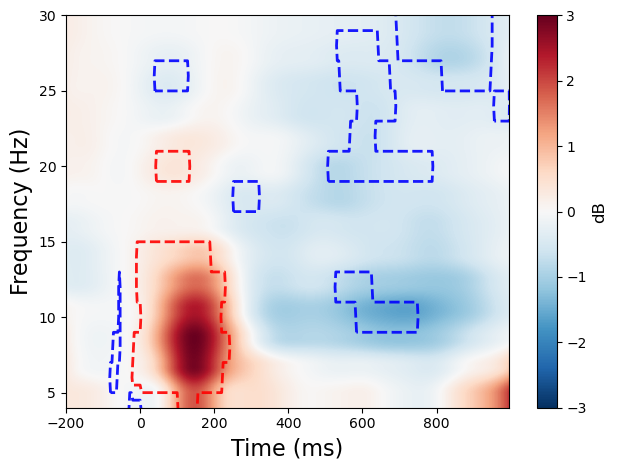

In [229]:
freqs = np.arange(4, 32, 2)
times = np.arange(-200, 1000, 4)
plot_tfr_results(tfr_first_No50, freqs, times, p=0.05, clusterp=0.05, clim=[-3, 3])


Permutation test

Side 1 begin:
Calculating: [====================================================================================================] 100.00%
Side 1 finished!

Side 2 begin:

Calculating: [====================================================================================================] 100.00%
Side 2 finished!

Cluster-based permutation test finished!



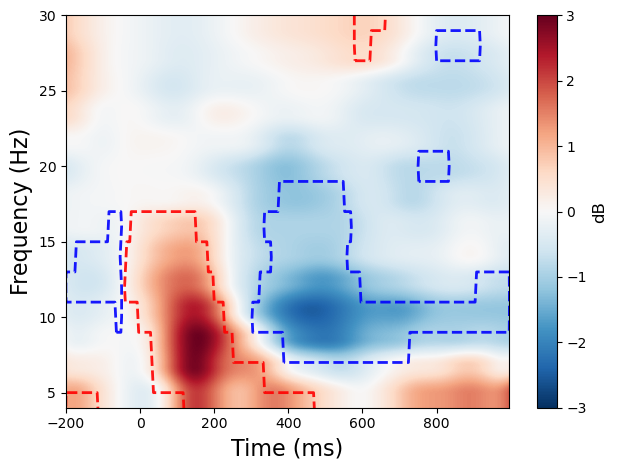

In [231]:
plot_tfr_results(tfr_rep_No50, freqs, times, p=0.05, clusterp=0.05, clim=[-3, 3])

In [235]:

def plot_tfr_diff_results(tfr1, tfr2, freqs, times, p=0.01, clusterp=0.05, clim=[-2, 2]):
    """
    可视化两个条件下的时频分析差异，并叠加显著性区域（使用 cluster-based permutation test）

    参数：
    tfr1 : ndarray，shape=[n_subs, n_freqs, n_times]，条件1的时频结果
    tfr2 : ndarray，shape=[n_subs, n_freqs, n_times]，条件2的时频结果
    freqs : array，shape=[n_freqs]，频率轴
    times : array，shape=[n_times]，时间轴
    p : float，单点 p 值阈值，默认 0.01
    clusterp : float，簇级别 p 值阈值，默认 0.05
    clim : list，[最小值, 最大值]，颜色条范围，默认 [-2, 2]
    """
    n_freqs = len(freqs)
    n_times = len(times)

    # 统计显著性检验
    stats_results = clusterbased_permutation_2d_2sided(
        tfr1, tfr2,
        p_threshold=p,
        clusterp_threshold=clusterp,
        iter=100  # 建议正式分析用1000或更高
    )

    # 计算条件差异
    tfr_diff = tfr1 - tfr2

    # 创建图像
    fig, ax = plt.subplots(1, 1)

    # pad 显著性矩阵以便画轮廓线
    pad_stats_results = np.zeros((n_freqs + 2, n_times + 2))
    pad_stats_results[1:n_freqs + 1, 1:n_times + 1] = stats_results

    x = np.concatenate(([times[0] - 1], times, [times[-1] + 1]))
    y = np.concatenate(([freqs[0] - 1], freqs, [freqs[-1] + 1]))
    X, Y = np.meshgrid(x, y)

    # 勾勒显著性区域轮廓
    ax.contour(X, Y, pad_stats_results, [0.5], colors="red", alpha=0.9,
               linewidths=2, linestyles="dashed")
    ax.contour(X, Y, pad_stats_results, [-0.5], colors="blue", alpha=0.9,
               linewidths=2, linestyles="dashed")

    # 绘制差异图
    im = ax.imshow(np.mean(tfr_diff, axis=0), cmap='RdBu_r', origin='lower',
                   extent=[times[0], times[-1], freqs[0], freqs[-1]], clim=clim)
    ax.set_aspect('auto')

    # 添加颜色条
    cbar = fig.colorbar(im)
    cbar.set_label(r'$\Delta$dB', fontsize=12)

    ax.set_xlabel('Time (ms)', fontsize=16)
    ax.set_ylabel('Frequency (Hz)', fontsize=16)
    plt.tight_layout()
    plt.show()



Permutation test

Side 1 begin:
Calculating: [====================================================================================================] 100.00%
Side 1 finished!

Side 2 begin:

Calculating: [====================================================================================================] 100.00%
Side 2 finished!

Cluster-based permutation test finished!



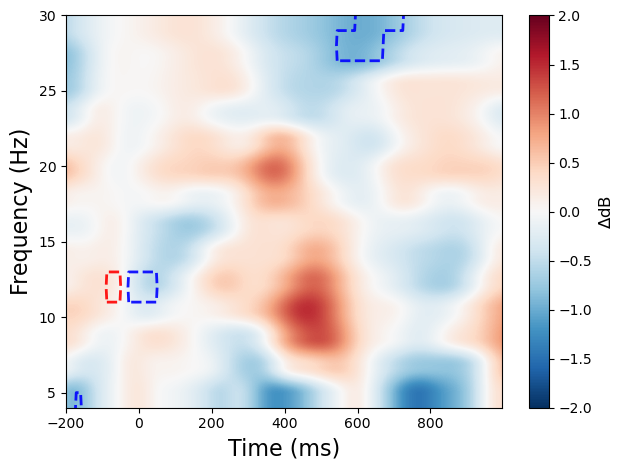

In [237]:
freqs = np.arange(4, 32, 2)
times = np.arange(-200, 1000, 4)
plot_tfr_diff_results(tfr_first_No50, tfr_rep_No50, freqs, times,
                      p=0.05, clusterp=0.05, clim=[-2, 2])

In [ ]:
第四章

In [239]:
! pip install inverted_encoding
import numpy as np
import sys
import os
from six.moves import urllib
import gdown
import zipfile
import scipy.io as sio
from scipy.stats import ttest_ind
import h5py
from tqdm import tqdm
from neurora.decoding import tbyt_decoding_kfold, ct_decoding_kfold
from neurora.rsa_plot import plot_tbyt_decoding_acc, \
                             plot_ct_decoding_acc, \
                             plot_rdm, plot_tbytsim_withstats
from neurora.rdm_cal import eegRDM
from neurora.corr_cal_by_rdm import rdms_corr
from neurora.stuff import smooth_1d
from inverted_encoding import IEM, permutation, circ_diff
from decimal import Decimal
import matplotlib.pyplot as plt

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [243]:

# 设置数据保存目录
data_dir = "data/"
if not os.path.exists(data_dir):
    os.makedirs(data_dir)

# 从 Google Drive 下载 zip 文件
url = "https://drive.google.com/uc?id=1POBi0dckB00AKCIvpXHZFI1Oqd-jWRoj"  
filename = "demo_data2"
filepath = data_dir + filename + ".zip"

# 下载数据
gdown.download(url=url, output=filepath, quiet=False, fuzzy=True)
print("Download complete!")

# 解压 zip 文件
with zipfile.ZipFile(filepath, 'r') as zip_ref:
    zip_ref.extractall(data_dir)
print("Unzip complete!")

# 💡 备注：百度网盘备份链接（手动下载）：
# 链接: https://pan.baidu.com/s/1mZdU9rL8vGn8-kjlUkF6PA  密码: 8qih
# 下载后请将解压好的数据手动放入 data 文件夹中


Downloading...
From (original): https://drive.google.com/uc?id=1POBi0dckB00AKCIvpXHZFI1Oqd-jWRoj
From (redirected): https://drive.google.com/uc?id=1POBi0dckB00AKCIvpXHZFI1Oqd-jWRoj&confirm=t&uuid=c8a2162a-7e39-4ef1-85c1-c082e2aaa292
To: /Users/chenbohan/Desktop/data/demo_data2.zip

  0%|                                                | 0.00/301M [00:00<?, ?B/s]
  0%|                                         | 524k/301M [00:00<05:31, 907kB/s]
  0%|▏                                      | 1.05M/301M [00:01<04:57, 1.01MB/s]
  1%|▏                                      | 1.57M/301M [00:01<04:23, 1.14MB/s]
  1%|▎                                      | 2.10M/301M [00:01<04:16, 1.17MB/s]
  1%|▎                                      | 2.62M/301M [00:02<04:08, 1.20MB/s]
  1%|▍                                      | 3.15M/301M [00:02<04:06, 1.21MB/s]
  1%|▍                                      | 3.67M/301M [00:03<04:10, 1.19MB/s]
  1%|▌                                      | 4.19M/301M [00:03<04:28

Download complete!
Unzip complete!


In [245]:
# 5个被试的编号
sub_ids = ['201', '202', '203', '204', '205']
# 对5个被试的数据进⾏遍历
for i, sub in enumerate(sub_ids):
 
 # 每个被试ERP数据、记忆项朝向标签和记忆项位置标签的⽂件地址
 subdata_path = 'data/demo_data2/data/ERP' + sub + '.mat'
 suborilabels_path = 'data/demo_data2/labels/ori_' + sub + '.txt'
 subposlabels_path = 'data/demo_data2/labels/pos_' + sub + '.txt'
 
 # 读取ERP数据
 subdata = sio.loadmat(subdata_path)['filtData']
 # 读取记忆项的朝向和位置的标签
 # 在.txt⽂件⾥，第⼀列为具体的朝向/位置值，第⼆列为16个朝向/位置对应的标签值（0-15的整数表示）
 suborilabels = np.loadtxt(suborilabels_path)[:, 1]
 subposlabels = np.loadtxt(subposlabels_path)[:, 1]
 
 # 打印被试编号、ERP数据矩阵的shape及两个标签矩阵的shape
 print('sub' + sub)
 print(subdata.shape)
 print(suborilabels.shape)
 print(subposlabels.shape)
 
 # 将每个被试的ERP数据及朝向和位置的标签以‘data’、'orilabels'和‘poslabels’
 # 作为Keys存在⼀个.h5⽂件⾥
 f = h5py.File('data/demo_data2/sub' + sub + '.h5', 'w')
 f.create_dataset('data', data=subdata)
 f.create_dataset('orilabels', data=suborilabels)
 f.create_dataset('poslabels', data=subposlabels)
 f.close()

sub201
(640, 27, 750)
(640,)
(640,)
sub202
(640, 27, 750)
(640,)
(640,)
sub203
(640, 27, 750)
(640,)
(640,)
sub204
(640, 27, 750)
(640,)
(640,)
sub205
(640, 27, 750)
(640,)
(640,)


In [247]:
subs = ["201", "202", "203", "204", "205"]
# 初始化三个变量data、label_ori和label_pos
# 分别⽤于后续存储脑电数据、朝向的标签和位置的标签
data = np.zeros([5, 640, 27, 500])
label_ori = np.zeros([5, 640])
label_pos = np.zeros([5, 640])
for i, sub in enumerate(subs):
 # 读取单个被试的.h5⽂件
 subfile = h5py.File('data/demo_data2/sub' + sub + '.h5', 'r')
 
 # 获取EEG数据
 subdata = subfile['data']
 
 # subdata的shape为[640, 27, 750]
 # 640 - 试次数； 27 - 导联数； 750 - 时间点数（从-1.5s到1.5s）
 # 取-0.5s到1.5s的数据
 subdata = subdata[:, :, 250:]
 
 # 读取朝向和位置标签
 sublabel_ori = subfile['orilabels']
 sublabel_pos = subfile['poslabels']
 
 data[i] = subdata
 label_ori[i] = sublabel_ori
 label_pos[i] = sublabel_pos

In [249]:
# 这⾥使⽤NeuroRA的decoding模块下的tbyt_decoding_kfold()函数进⾏逐时间点解码
# 传⼊数据（shape为[n_subs, n_trials, n_channels, n_times]）、对应每个试次的标签
# 以及⼀些其他参数：
# n=16 - 分类类别数为16（共16中朝向）
# navg=13 - 对13个试次进⾏⼀次平均
# time_win=5 - 时间窗为5（即5个时间点的数据进⾏⼀次平均）
# time_step=5 - 时间步⻓为5（即每间隔5个时间点进⾏⼀次解码）
# nfolds=3 & nrepeats=10 - 进⾏10次3折的交叉验证
# smooth=True - 对结果进⾏平滑处理
accs_ori = tbyt_decoding_kfold(data, label_ori, n=16, navg=13, time_win=5, time_step=5,
 nfolds=3, nrepeats=10, smooth=True)

Calculating: [====================================================================================================] 100.00%
Decoding finished!




Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!


Significant time-windows:
200ms to 500ms
640ms to 740ms


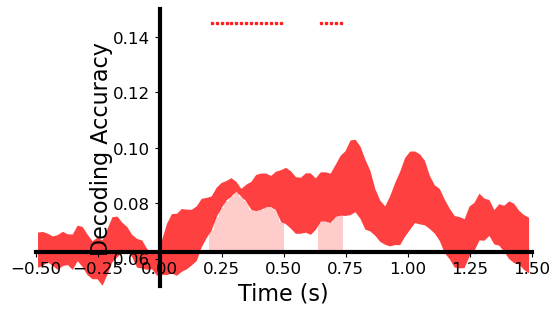

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
       0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [251]:
# 这⾥使⽤NeuroRA的decoding模块下的plot_tbyt_decoding_acc()函数进⾏统计分析与可视化
# 其要求输⼊解码的结果（shape为[n_subs, n_results_times]）和⼀些其他参数：
# start_time=-0.5 - 解码结果的开始时间为-0.5s
# end_time=1.5 - 解码结果的结束时间为1.5s、
# time_interval=0.02 - 两解码时间间隔为0.02s
#（由于时间窗为5，数据原采样率为250Hz，5*(1/250)=0.02s）、
# chance=0.0625 - 随机⽔平的分类准确率为0.0625（16个朝向，即1/16）
# p=0.05 - p值的阈值、
# cbpt=True - 进⾏cluster-based permutation test、
# stats_time=[0, 1.5] - 统计0-1.5s的解码结果、
# xlim=[-0.5, 1.5] - x轴显示范围从-0.5到1.5
# ylim=[0.05, 0.15] - y轴显示范围从0到1.5
plot_tbyt_decoding_acc(accs_ori, start_time=-0.5, end_time=1.5, time_interval=0.02,
 chance=0.0625, p=0.05, cbpt=True, stats_time=[0, 1.5],
 xlim=[-0.5, 1.5], ylim=[0.05, 0.15])

In [253]:
accs_pos = tbyt_decoding_kfold(data, label_pos, n=16, navg=13, time_win=5, time_step=5,
 nfolds=3, nrepeats=10, smooth=True)

Calculating: [====================================================================================================] 100.00%
Decoding finished!




Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!


Significant time-windows:
0ms to 459ms
860ms to 1100ms
1240ms to 1340ms


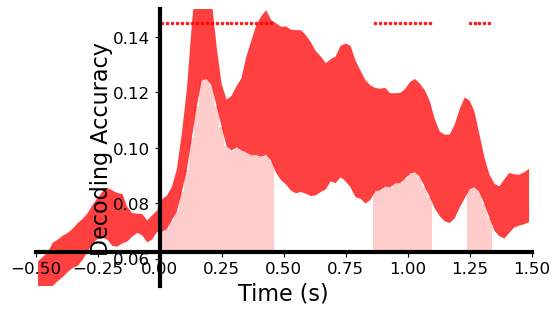

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.])

In [255]:

plot_tbyt_decoding_acc(accs_pos, start_time=-0.5, end_time=1.5, time_interval=0.02,
 chance=0.0625, p=0.05, cbpt=True, stats_time=[0, 1.5],
 xlim=[-0.5, 1.5], ylim=[0.05, 0.15])

In [257]:
# 这⾥使⽤NeuroRA的decoding模块下的ct_decoding_kfold()函数进⾏跨时域解码
accs_crosstime_ori = ct_decoding_kfold(data, label_ori, n=16, navg=13,
 time_win=5, time_step=5,
 nfolds=3, nrepeats=10, smooth=True)


Decoding
Calculating: [====================================================================================================] 100.00%
Decoding finished!



In [259]:

accs_crosstime_pos = ct_decoding_kfold(data, label_pos, n=16, navg=13,
 time_win=5, time_step=5,
 nfolds=3, nrepeats=10, smooth=True)


Decoding
Calculating: [====================================================================================================] 100.00%
Decoding finished!




Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!



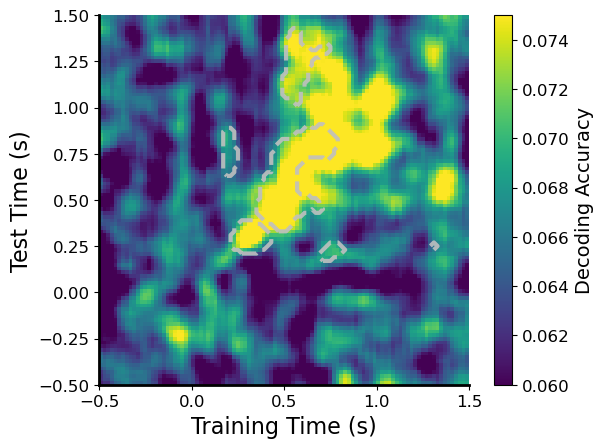

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [261]:

# 这⾥使⽤NeuroRA的decoding模块下的plot_ct_decoding_acc()函数进⾏统计分析与可视化
plot_ct_decoding_acc(accs_crosstime_ori, start_timex=-0.5, end_timex=1.5,
 start_timey=-0.5, end_timey=1.5,
 time_intervalx=0.02, time_intervaly=0.02,
 chance=0.0625, p=0.05, cbpt=True,
 stats_timex=[0, 1.5], stats_timey=[0, 1.5],
 xlim=[-0.5, 1.5], ylim=[-0.5, 1.5], clim=[0.06, 0.075])


Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!



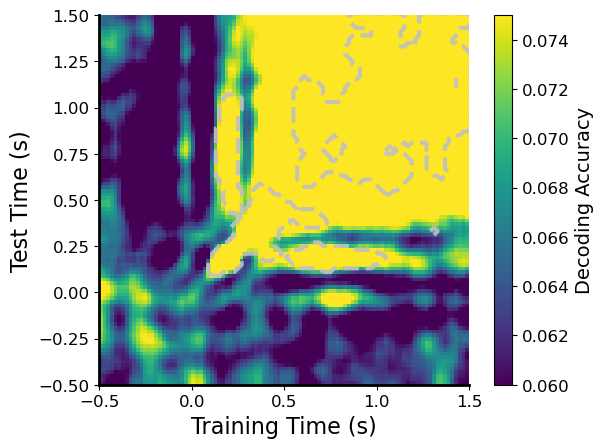

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

In [263]:
plot_ct_decoding_acc(accs_crosstime_pos, start_timex=-0.5, end_timex=1.5,
 start_timey=-0.5, end_timey=1.5,
 time_intervalx=0.02, time_intervaly=0.02,
 chance=0.0625, p=0.05, cbpt=True,
 stats_timex=[0, 1.5], stats_timey=[0, 1.5],
 xlim=[-0.5, 1.5], ylim=[-0.5, 1.5], clim=[0.06, 0.075])

In [271]:
n_subs = 5
n_trials = 640
# ⾸先对数据进⾏重新划分
# 分别获取16个朝向条件下的脑电数据和16个位置条件下的脑电数据
# 初始化两个变量data_ori和data_pos分别⽤于存储朝向和位置的数据
data_ori = np.zeros([16, n_subs, 40, 27, 500])
data_pos = np.zeros([16, n_subs, 40, 27, 500])
for sub in range(n_subs):
    index_ori = np.zeros([16], dtype=int)
    index_pos = np.zeros([16], dtype=int)
    for i in range(n_trials):
        ori = int(label_ori[sub, i])
        pos = int(label_pos[sub, i])
        data_ori[ori, sub, index_ori[ori]] = data[sub, i]
        index_ori[ori] = index_ori[ori] + 1
        data_pos[pos, sub, index_pos[pos]] = data[sub, i]
        index_pos[pos] = index_pos[pos] + 1
 
# 使⽤NeuroRA的rdm_cal模块下的eegRDM()函数计算脑电RDMs
# 朝向RDMs
RDMs_ori = eegRDM(data_ori, sub_opt=1, chl_opt=0, time_opt=1, time_win=5, time_step=5)
# 位置RDMs
RDMs_pos = eegRDM(data_pos, sub_opt=1, chl_opt=0, time_opt=1, time_win=5, time_step=5)
# 返回的RDMs_ori和RDMs_pos的shape均为[n_subs即5, n_results_time即100, 16, 16]


Computing RDMs
Calculating: [====================================================================================================] 100.00%
RDMs computing finished!

Computing RDMs
Calculating: [====================================================================================================] 100.00%
RDMs computing finished!


1


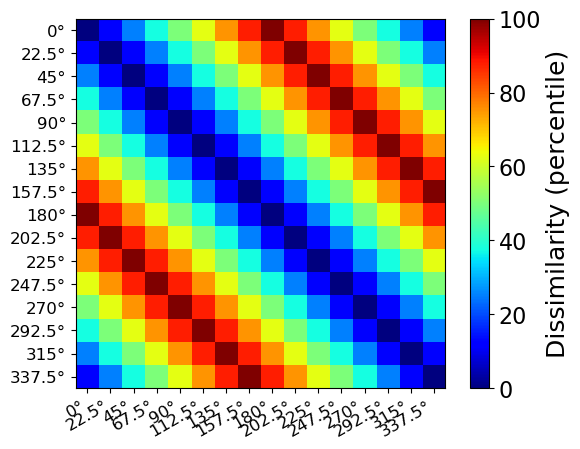

0

In [275]:
model_RDM = np.zeros([16, 16])
for i in range(16):
    for j in range(16):
        diff = np.abs(i - j)
        if diff <= 8:
            model_RDM[i, j] = diff / 8
        else:
            model_RDM[i, j] = (16 - diff) / 8
# 使⽤NeuroRA的rsa_plot模块下的plot_rdm()函数可视化RDM
conditions = ["0°", "22.5°", "45°", "67.5°", "90°", "112.5°", "135°", "157.5°", "180°",
 "202.5°", "225°", "247.5°", "270°", "292.5°", "315°", "337.5°"]
plot_rdm(model_RDM, percentile=True, conditions=conditions)

In [277]:
# 使⽤NeuroRA的corr_cal_by_rdm模块下的rdms_corr()函数
# 计算基于假设的RDM和朝向的EEG RDMs的相似性
similarities_ori = rdms_corr(model_RDM, RDMs_ori)
# 计算基于假设的RDM和位置的EEG RDMs的相似性
similarities_pos = rdms_corr(model_RDM, RDMs_pos)


Computing similarities

Computing finished!

Computing similarities

Computing finished!



Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!


Significant time-windows:
219ms to 360ms
380ms to 620ms
640ms to 880ms


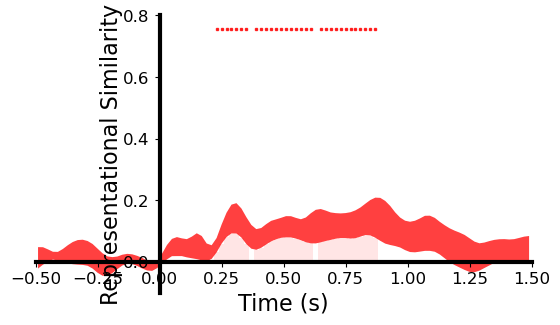

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [279]:
# 使⽤NeuroRA的rsa_plot模块下的plot_tbytsim_withstats()函数
# ⽤法与plot_tbyt_decoding_acc()函数类似
plot_tbytsim_withstats(similarities_ori, start_time=-0.5, end_time=1.5,
 time_interval=0.02, smooth=True, p=0.05, cbpt=True,
 stats_time=[0, 1.5], xlim=[-0.5, 1.5], ylim=[-0.1, 0.8])


Permutation test
Calculating: [====================================================================================================] 100.00%
Cluster-based permutation test finished!


Significant time-windows:
40ms to 1020ms


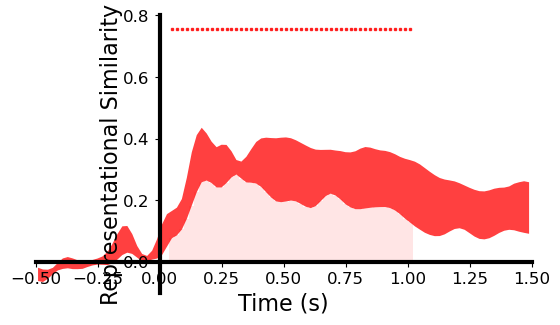

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [281]:
plot_tbytsim_withstats(similarities_pos, start_time=-0.5, end_time=1.5,
 time_interval=0.02, smooth=True, p=0.05, cbpt=True,
 stats_time=[0, 1.5], xlim=[-0.5, 1.5], ylim=[-0.1, 0.8])

In [297]:
import numpy as np
import types
import inverted_encoding

# 1. 你自己定义的 gaussian 函数
def gaussian(length, std):
    x = np.arange(0, length, 1)
    center = (length - 1) / 2
    return np.exp(-0.5 * ((x - center) / std) ** 2)

# 2. 创建一个假的 signal 模块（只包含 gaussian 函数）
fake_signal = types.SimpleNamespace(gaussian=gaussian)

# 3. 替换 inverted_encoding 内部引用的 signal
inverted_encoding.signal = fake_signal



In [299]:
n_subs = 5
n_ts = 100
# 初始化mae_ori来存储IEM解码的MAE结果
mae_ori = np.zeros([n_subs, n_ts])
# 使⽤Inverted_Encoding的IEM函数计算逐被试、逐时间点的MAE
for t in tqdm(range(n_ts)):
    for sub in range(n_subs):
 
 # 降采样数据 - 即对每5个时间点平均
        data_t_sub = np.average(data[sub, :, :, t*5:t*5+5], axis=2)
 
 # 获取IEM预测结果
        predictions, _, _, _ = IEM(data_t_sub, label_ori[sub].astype(int),
                                   stim_max=16, nfolds=5, is_circular=True)
 
 # 计算MAE
        mae_ori[sub, t] = np.mean(np.abs(circ_diff(predictions, label_ori[sub].astype(int), 16)))
# 使⽤Inverted_Encoding的permutation()函数获取MAE的Null分布
null_mae_ori = permutation(label_ori[sub].astype(int), stim_max=16,num_perm=5000, is_circular=True)


100%|█████████████████████████████████████████| 100/100 [00:27<00:00,  3.69it/s]


In [301]:
def plot_iem_results(mae_ori, null_mae, start_time=0, end_time=1, time_interval=0.01,
                     stats_time=[0, 1], xlim=[0, 1], ylim=[-0.1, 0.8]):
    """
    参数：
    mae：shape为[n_subs, n_times]的矩阵，对应每个被试的MAE结果
    null_mae：shape为[num_perm]的矩阵，对应Null分布
    start_time：起始时间，默认为0
    end_time：结束时间，默认为1
    time_interval：两时间点之间的间隔，默认为0.01
    xlim：X轴范围，默认[0, 1]
    ylim：Y轴范围，默认[-0.1, 0.8]
    """
    if len(np.shape(mae_ori)) != 2:
        return "Invalid input!"
    n = len(np.shape(mae_ori))
    yminlim = ylim[0]
    ymaxlim = ylim[1]
    nsubs, nts = np.shape(mae_ori)
    tstep = float(Decimal((end_time - start_time) / nts).quantize(Decimal(str(time_interval))))
    if tstep != time_interval:
        return "Invalid input!"
    delta1 = (stats_time[0] - start_time) / tstep - int((stats_time[0] - start_time) / tstep)
    delta2 = (stats_time[1] - start_time) / tstep - int((stats_time[1] - start_time) / tstep)
    mae_ori = smooth_1d(mae_ori)
    avg = np.average(np.average(null_mae) - mae_ori, axis=0)
    err = np.zeros([nts])
    for t in range(nts):
        err[t] = np.std(mae_ori[:, t], ddof=1) / np.sqrt(nsubs)
    ps = np.zeros([nts])
    for t in range(nts):
        ps[t] = ttest_ind(mae_ori[:, t], null_mae, alternative='less')[1]
        if ps[t] < 0.05:
            ps[t] = 1
        else:
            ps[t] = 0
    print('\nSignificant time-windows:')
    for t in range(nts):
        if t == 0 and ps[t] == 1:
            print(str(int(start_time * 1000)) + 'ms to ', end='')
        if t > 0 and ps[t] == 1 and ps[t - 1] == 0:
            print(str(int((start_time + t * tstep) * 1000)) + 'ms to ', end='')
        if t < nts - 1 and ps[t] == 1 and ps[t + 1] == 0:
            print(str(int((start_time + (t + 1) * tstep) * 1000)) + 'ms')
        if t == nts - 1 and ps[t] == 1:
            print(str(int(end_time * 1000)) + 'ms')
    for t in range(nts):
        if ps[t] == 1:
            plt.plot(t * tstep + start_time + 0.5 * tstep, (ymaxlim - yminlim) * 0.95 + yminlim,
                     's', color='r', alpha=0.8, markersize=2)
            xi = [t * tstep + start_time, t * tstep + tstep + start_time]
            ymin = [0]
            ymax = [avg[t] - err[t]]
            plt.fill_between(xi, ymax, ymin, facecolor='r', alpha=0.1)
    fig = plt.gcf()
    fig.set_size_inches(6.4, 3.6)
    ax = plt.gca()
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(3)
    ax.spines["left"].set_position(("data", 0))
    ax.spines["bottom"].set_linewidth(3)
    ax.spines['bottom'].set_position(('data', 0))
    x = np.arange(start_time + 0.5 * tstep, end_time + 0.5 * tstep, tstep)
    plt.plot(x, avg, color='r', alpha=0.95)
    plt.fill_between(x, avg + err, avg - err, facecolor='r', alpha=0.75)
    plt.ylim(yminlim, ymaxlim)
    plt.xlim(xlim[0], xlim[1])
    plt.tick_params(labelsize=12)
    plt.xlabel('Time (s)', fontsize=16)
    plt.ylabel(r'$\Delta$MAE', fontsize=16)
    plt.show()
    return ps






Significant time-windows:
219ms to 1440ms


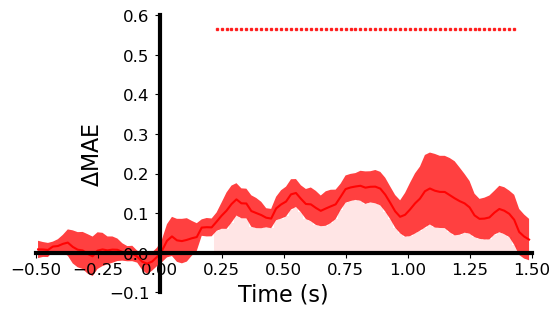

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.])

In [303]:
plot_iem_results(mae_ori, null_mae_ori, start_time=-0.5, end_time=1.5, time_interval=0.02,
 xlim=[-0.5, 1.5], ylim=[-0.1, 0.6])

In [309]:
from tqdm import tqdm
import numpy as np

# 初始化mae_pos来存储IEM解码的MAE结果
mae_pos = np.zeros([n_subs, n_ts])

# 使⽤ Inverted_Encoding 的 IEM 函数计算逐被试、逐时间点的 MAE
for t in tqdm(range(n_ts)):
    for sub in range(n_subs):
        # 降采样数据 - 即对每5个时间点平均
        data_t_sub = np.average(data[sub, :, :, t * 5 : t * 5 + 5], axis=2)

        # 获取 IEM 预测结果
        predictions, _, _, _ = IEM(
            data_t_sub,
            label_pos[sub].astype(int),
            stim_max=16,
            nfolds=5,
            is_circular=True
        )

        # 计算 MAE
        mae_pos[sub, t] = np.mean(np.abs(circ_diff(predictions, label_pos[sub].astype(int), 16)))

# 使⽤ Inverted_Encoding 的 permutation() 函数获取 MAE 的 Null 分布
null_mae_pos = permutation(
    label_pos[sub].astype(int),
    stim_max=16,
    num_perm=5000,
    is_circular=True
)



100%|█████████████████████████████████████████| 100/100 [00:26<00:00,  3.72it/s]



Significant time-windows:
0ms to 1500ms


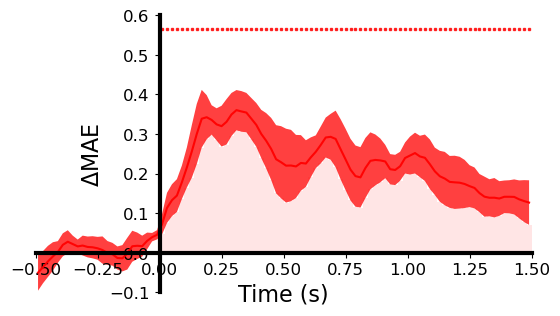

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [311]:
plot_iem_results(mae_pos, null_mae_pos, start_time=-0.5, end_time=1.5, time_interval=0.02,
 xlim=[-0.5, 1.5], ylim=[-0.1, 0.6])